In [2]:
!pip install tensorflow

In [3]:
!pip install opencv-python

In [4]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
import zipfile
import os
from skimage.metrics import structural_similarity as ssim
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore')

print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.19.0


TensorFlow version: 2.19.0
🚀 Starting Dataset Loading Process...
STEP 1: Upload your dataset zip file
Please click the 'Choose Files' button below to upload your MRI dataset zip file...


Saving your_dataset.zip to your_dataset.zip
✅ Successfully uploaded: your_dataset.zip
File size: 0.03 MB
📁 Extracting dataset to: /content/dataset
✅ Extraction successful! Found 5 files
📄 First 10 files found:
   1. MildImpairment (1000).jpg
   2. MildImpairment (100).jpg
   3. MildImpairment (10).jpg
   4. MildImpairment (1001).jpg
   5. MildImpairment (1).jpg
📥 Loading MRI images...
🔍 Original image shape for MildImpairment (1000).jpg: (128, 128)
🖼️  Image shape after resizing: (128, 128)
🔍 Original image shape for MildImpairment (100).jpg: (128, 128)
🖼️  Image shape after resizing: (128, 128)
🔍 Original image shape for MildImpairment (10).jpg: (128, 128)
🖼️  Image shape after resizing: (128, 128)
🔍 Original image shape for MildImpairment (1001).jpg: (128, 128)
🖼️  Image shape after resizing: (128, 128)
🔍 Original image shape for MildImpairment (1).jpg: (128, 128)
🖼️  Image shape after resizing: (128, 128)
✅ Successfully loaded 5 MRI images
📊 Image shape: (128, 128)
📈 Data range: [-1

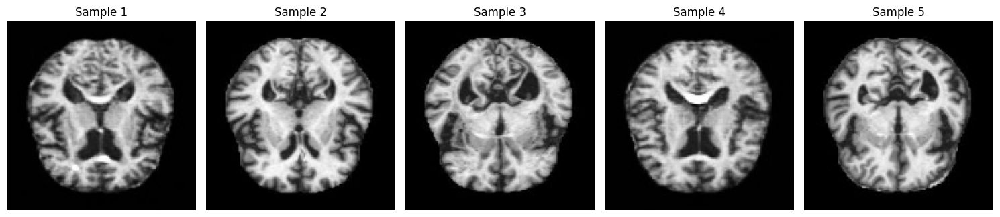


📊 YOUR DATASET STATISTICS:
   Total images: 5
   Image shape: (128, 128)
   Data type: float64
   Value range: [-1.000, 1.000]
   Mean: -0.433
   Std: 0.648

🎯 Ready to proceed to Step 3: Lesion Detection and Quadrant Division!


In [5]:
# Step 2: Direct Upload and Preprocess Dataset
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
import zipfile
import os
from google.colab import files

print("TensorFlow version:", tf.__version__)

# Direct file upload function
def upload_and_extract_dataset():
    """Upload zip file directly to Colab and extract it"""
    print("=" * 60)
    print("STEP 1: Upload your dataset zip file")
    print("=" * 60)
    print("Please click the 'Choose Files' button below to upload your MRI dataset zip file...")

    # Upload the file
    uploaded = files.upload()

    if not uploaded:
        # Add a clear message if no file was uploaded
        print("❌ No file uploaded. Please upload your dataset zip file to continue.")
        return None # Return None to indicate no file was uploaded

    # Get the uploaded filename
    zip_filename = list(uploaded.keys())[0]
    print(f"✅ Successfully uploaded: {zip_filename}")
    print(f"File size: {len(uploaded[zip_filename]) / (1024*1024):.2f} MB")

    # Create extraction directory
    extract_path = '/content/dataset'
    os.makedirs(extract_path, exist_ok=True)

    # Extract the zip file
    print(f"📁 Extracting dataset to: {extract_path}")
    try:
        with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
            zip_ref.extractall(extract_path)
        # List extracted files - only if extraction was successful
        extracted_files = []
        for root, dirs, files_in_dir in os.walk(extract_path): # Renamed 'files' to 'files_in_dir'
            for file in files_in_dir:
                extracted_files.append(os.path.join(root, file))

        print(f"✅ Extraction successful! Found {len(extracted_files)} files")

        # Show first few files - only if extraction was successful
        print("📄 First 10 files found:")
        for i, file_path in enumerate(extracted_files[:10]):
            print(f"   {i+1}. {os.path.basename(file_path)}")
        if len(extracted_files) > 10:
            print(f"   ... and {len(extracted_files) - 10} more files")

    except Exception as e:
        print(f"❌ Error during extraction: {e}")
        # Clean up the potentially incomplete extraction directory
        if os.path.exists(extract_path):
            os.system(f"rm -rf {extract_path}")
        return None # Return None to indicate extraction failure

    return extract_path

# Reverted img_size back to (128, 128)
def load_mri_images(data_path, img_size=(128, 128)):
    """Load and preprocess MRI images from the extracted dataset"""
    if data_path is None or not os.path.exists(data_path):
        print("❌ Data path is invalid or does not exist. Cannot load images.")
        return np.array([]) # Return an empty array

    print("📥 Loading MRI images...")
    images = []
    valid_extensions = ['.jpg', '.jpeg', '.png', '.tif', '.tiff', '.bmp']
    supported_files = []

    # Walk through directory and find image files
    for root, dirs, files in os.walk(data_path):
        for file in files:
            file_ext = os.path.splitext(file.lower())[1]
            if file_ext in valid_extensions:
                img_path = os.path.join(root, file)
                try:
                    # Read image in grayscale
                    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                    if img is not None:
                         # Print original image shape
                        print(f"🔍 Original image shape for {os.path.basename(img_path)}: {img.shape}")
                        # Resize to target size
                        img = cv2.resize(img, img_size)
                        # Print image shape after resizing
                        print(f"🖼️  Image shape after resizing: {img.shape}")
                        # Normalize to [-1, 1] for GAN training
                        img = (img - 127.5) / 127.5
                        images.append(img)
                        supported_files.append(file)
                    else:
                        print(f"⚠️  Could not read: {file}")
                except Exception as e:
                    print(f"❌ Error processing {file}: {e}")

    if not images:
        print("❌ No valid images found in the uploaded dataset! Please check your zip file contains supported image formats.")
        return np.array([]) # Return an empty array if no images are found

    images = np.array(images)
    print(f"✅ Successfully loaded {len(images)} MRI images")
    print(f"📊 Image shape: {images[0].shape}")
    print(f"📈 Data range: [{images.min():.2f}, {images.max():.2f}]")

    return images

# Main execution for Step 2
print("🚀 Starting Dataset Loading Process...")
print("=" * 60)

# Upload and extract dataset
data_path = upload_and_extract_dataset()

# Load MRI images only if data_path is not None
if data_path:
    mri_images = load_mri_images(data_path)

    if len(mri_images) > 0:
        print("=" * 60)
        print("✅ STEP 2 COMPLETED SUCCESSFULLY!")
        print("=" * 60)

        # Display sample images from the loaded dataset
        print("\n🖼️  Displaying sample images from YOUR uploaded dataset...")
        plt.figure(figsize=(15, 5))

        # Display first 5 images
        for i in range(min(5, len(mri_images))):
            plt.subplot(1, 5, i+1)
            # Denormalize for display: convert from [-1,1] to [0,1]
            display_img = mri_images[i] * 0.5 + 0.5
            plt.imshow(display_img, cmap='gray')
            plt.title(f"Sample {i+1}")
            plt.axis('off')

        plt.tight_layout()
        plt.show()

        # Dataset statistics
        print("\n📊 YOUR DATASET STATISTICS:")
        print(f"   Total images: {len(mri_images)}")
        print(f"   Image shape: {mri_images[0].shape}")
        print(f"   Data type: {mri_images.dtype}")
        print(f"   Value range: [{mri_images.min():.3f}, {mri_images.max():.3f}]")
        print(f"   Mean: {mri_images.mean():.3f}")
        print(f"   Std: {mri_images.std():.3f}")

        print("\n🎯 Ready to proceed to Step 3: Lesion Detection and Quadrant Division!")
    else:
        print("=" * 60)
        print("❌ STEP 2 FAILED: No images were loaded from the dataset.")
        print("=" * 60)

else:
    print("=" * 60)
    print("❌ STEP 2 FAILED: Dataset upload or extraction was unsuccessful.")
    print("=" * 60)

Creating quadrant dataset...
Processing the first 5 images for visualization...
Processing image 1/5...
Lesion Bounding Box (x_start, y_start, width, height): (16, 12, 96, 102)
Lesion Center (x, y): (64, 63)
Processing image 2/5...
Lesion Bounding Box (x_start, y_start, width, height): (14, 11, 98, 105)
Lesion Center (x, y): (63, 63)
Processing image 3/5...
Lesion Bounding Box (x_start, y_start, width, height): (13, 11, 100, 104)
Lesion Center (x, y): (63, 63)
Processing image 4/5...
Lesion Bounding Box (x_start, y_start, width, height): (17, 13, 94, 101)
Lesion Center (x, y): (64, 63)
Processing image 5/5...
Lesion Bounding Box (x_start, y_start, width, height): (15, 13, 95, 102)
Lesion Center (x, y): (62, 64)
Original images shape: (5, 128, 128)
Quadrant images shape: (5, 4, 128, 128)


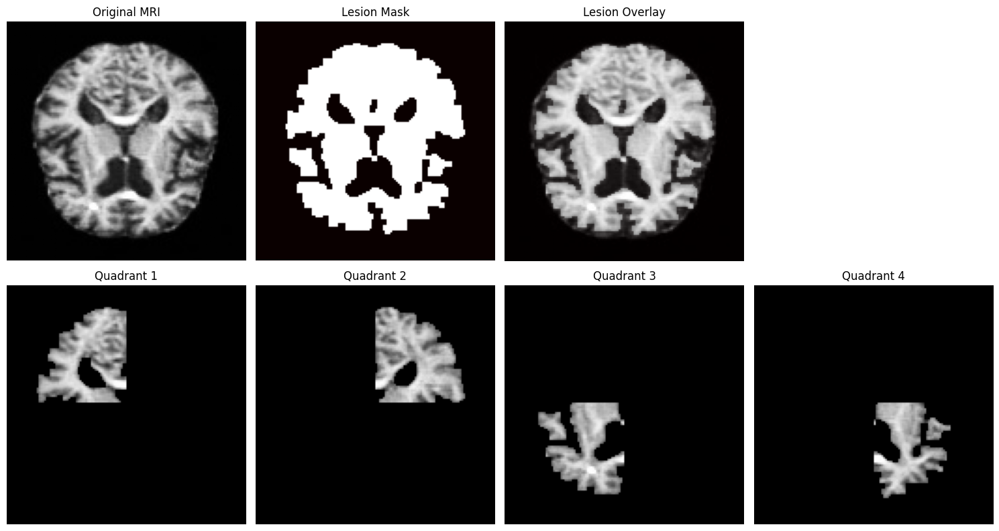

In [6]:
def detect_lesion_regions(img, method='otsu', simple_threshold_value=100):
    """
    Detect lesion regions in MRI images using different thresholding methods.
    Returns binary mask of potential lesion areas.

    Args:
        img (np.ndarray): Grayscale input image (normalized to [-1, 1]).
        method (str): Thresholding method ('otsu', 'adaptive', or 'simple').
        simple_threshold_value (int): Threshold value for 'simple' method (0-255).

    Returns:
        np.ndarray: Binary mask of potential lesion areas (normalized to [0, 1]).
    """
    # Denormalize for processing (convert from [-1, 1] to [0, 255])
    img_processed = ((img * 0.5 + 0.5) * 255).astype(np.uint8)

    if method == 'otsu':
        # Otsu's thresholding
        _, binary_mask = cv2.threshold(img_processed, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    elif method == 'adaptive':
        # Adaptive thresholding
        binary_mask = cv2.adaptiveThreshold(img_processed, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                          cv2.THRESH_BINARY, 11, 2)
    elif method == 'simple':
        # Simple threshold based on intensity
        _, binary_mask = cv2.threshold(img_processed, simple_threshold_value, 255, cv2.THRESH_BINARY)
    else:
        print(f"Warning: Unknown thresholding method '{method}'. Using 'otsu' by default.")
        _, binary_mask = cv2.threshold(img_processed, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)


    # Morphological operations to clean the mask
    kernel = np.ones((3,3), np.uint8)
    binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)
    binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    return binary_mask # Return mask as 0 or 1 (float)

def divide_into_quadrants(img, mask):
    """
    Divide the lesion region into 4 quadrants based on the lesion mask.
    Returns 4 quadrant images focusing on the lesion region.
    Each quadrant image will have the original image size, with only the
    lesion part within that quadrant being non-zero.

    Args:
        img (np.ndarray): Grayscale input image (normalized to [-1, 1]).
        mask (np.ndarray): Binary mask of potential lesion areas (0 or 1 float).

    Returns:
        list of np.ndarray: A list of 4 images, each representing a quadrant
                           of the lesion region within the original image size.
                           Values are normalized to [-1, 1].
    """
    h, w = img.shape

    # Find coordinates of non-zero pixels in the mask (lesion area)
    lesion_coords = np.argwhere(mask > 0)

    if lesion_coords.shape[0] == 0:
        print("No lesion detected for quadrant division.")
        # If no lesion detected, return empty quadrants with black background
        return [np.full((h, w), -1.0) for _ in range(4)]


    # Calculate the bounding box of the lesion from coordinates
    min_y, min_x = lesion_coords.min(axis=0)
    max_y, max_x = lesion_coords.max(axis=0)

    # Define the boundaries of the lesion bounding box
    lesion_x_start, lesion_x_end = min_x, max_x + 1 # Add 1 to max to include the last pixel
    lesion_y_start, lesion_y_end = min_y, max_y + 1

    # Calculate the center of the lesion bounding box
    lesion_center_x = lesion_x_start + (lesion_x_end - lesion_x_start) // 2
    lesion_center_y = lesion_y_start + (lesion_y_end - lesion_y_start) // 2

    print(f"Lesion Bounding Box (x_start, y_start, width, height): ({lesion_x_start}, {lesion_y_start}, {lesion_x_end - lesion_x_start}, {lesion_y_end - lesion_y_start})")
    print(f"Lesion Center (x, y): ({lesion_center_x}, {lesion_center_y})")


    quadrants = []

    # Define quadrant boundaries based on the lesion bounding box center
    quadrant_boundaries = [
        ((lesion_y_start, lesion_center_y), (lesion_x_start, lesion_center_x)), # Top-Left
        ((lesion_y_start, lesion_center_y), (lesion_center_x, lesion_x_end)),   # Top-Right
        ((lesion_center_y, lesion_y_end), (lesion_x_start, lesion_center_x)),   # Bottom-Left
        ((lesion_center_y, lesion_y_end), (lesion_center_x, lesion_x_end))    # Bottom-Right
    ]

    for (y_bounds, x_bounds) in quadrant_boundaries:
        y_start, y_end = y_bounds
        x_start, x_end = x_bounds

        # Ensure boundaries are within the original image dimensions
        y_start = max(0, y_start)
        y_end = min(h, y_end)
        x_start = max(0, x_start)
        x_end = min(w, x_end)

        # Create a mask for the current quadrant within the original image size
        quadrant_mask = np.zeros_like(mask)
        quadrant_mask[y_start:y_end, x_start:x_end] = 1

        # Combine the lesion mask and the quadrant mask
        # This combined mask is 1 only for lesion pixels within the current quadrant
        combined_mask = (mask > 0) * (quadrant_mask > 0) # Ensure boolean mask for logical AND

        # Create a black background image (-1 in normalized range)
        quadrant_img = np.full((h, w), -1.0)

        # Copy original image pixels only where the combined mask is 1
        # Need to handle the data types for boolean indexing
        quadrant_img[combined_mask.astype(bool)] = img[combined_mask.astype(bool)]

        quadrants.append(quadrant_img)

    return quadrants

def create_quadrant_dataset(images, detection_method='otsu', threshold_value=100):
    """
    Create dataset with original images and their 4 quadrant parts
    """
    original_imgs = []
    quadrant_imgs_list = []

    for i, img in enumerate(images):
        print(f"Processing image {i+1}/{len(images)}...")
        # Detect lesion regions using specified method and value
        lesion_mask = detect_lesion_regions(img, method=detection_method, simple_threshold_value=threshold_value)

        # Divide into quadrants
        quadrants = divide_into_quadrants(img, lesion_mask)

        original_imgs.append(img)
        quadrant_imgs_list.append(quadrants)

    return np.array(original_imgs), np.array(quadrant_imgs_list)

# Create quadrant dataset
print("Creating quadrant dataset...")
# Ensure mri_images is defined and not empty before proceeding
if 'mri_images' in globals() and len(mri_images) > 0:
    # --- Adjust these parameters to experiment with lesion detection ---
    detection_method = 'otsu' # Options: 'otsu', 'adaptive', 'simple'
    simple_threshold_value = 100 # Only used if detection_method is 'simple'
    # -----------------------------------------------------------------

    # Process a smaller number of images for quicker debugging
    num_images_to_process = min(10, len(mri_images))
    print(f"Processing the first {num_images_to_process} images for visualization...")

    original_imgs, quadrant_imgs = create_quadrant_dataset(
        mri_images[:num_images_to_process],
        detection_method=detection_method,
        threshold_value=simple_threshold_value
    )

    print(f"Original images shape: {original_imgs.shape}")
    print(f"Quadrant images shape: {quadrant_imgs.shape}")

    # Visualize lesion detection and quadrant division
    def visualize_lesion_detection(original_img, quadrants, detection_method='otsu', simple_threshold_value=100):
        # Increased figsize for potentially better clarity
        fig, axes = plt.subplots(2, 4, figsize=(15, 8)) # Create a 2x4 grid

        # Original image
        axes[0,0].imshow(original_img * 0.5 + 0.5, cmap='gray')
        axes[0,0].set_title('Original MRI')
        axes[0,0].axis('off')

        # Lesion mask
        # Re-calculate mask for visualization with potentially updated parameters
        lesion_mask = detect_lesion_regions(original_img, method=detection_method, simple_threshold_value=simple_threshold_value)
        axes[0,1].imshow(lesion_mask, cmap='hot')
        axes[0,1].set_title('Lesion Mask')
        axes[0,1].axis('off')

        # Overlay
        axes[0,2].imshow(original_img * 0.5 + 0.5, cmap='gray')
        axes[0,2].imshow(lesion_mask, cmap='hot', alpha=0.3)
        axes[0,2].set_title('Lesion Overlay')
        axes[0,2].axis('off')

        # Hide the unused subplot in the first row
        axes[0, 3].axis('off')


        # Quadrants - place them in the second row
        for i in range(4):
            row_idx = 1
            col_idx = i
            # The quadrant images already represent the lesion within the quadrant bounds
            # They are of original image size with non-lesion areas (outside the quadrant or lesion) as zero.
            # We still display them as is, the black areas are intentional.
            axes[row_idx, col_idx].imshow(quadrants[i] * 0.5 + 0.5, cmap='gray')
            axes[row_idx, col_idx].set_title(f'Quadrant {i+1}')
            axes[row_idx, col_idx].axis('off')


        plt.tight_layout()
        plt.show()

    # Visualize for a sample image
    sample_idx = 0
    # Pass the detection parameters to visualization function
    visualize_lesion_detection(original_imgs[sample_idx], quadrant_imgs[sample_idx], detection_method=detection_method, simple_threshold_value=simple_threshold_value)
else:
    print("mri_images variable is not defined or empty. Please run the previous cell to load the dataset.")

In [7]:
# Step 4: Custom Loss Functions (Fixed)
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
import numpy as np

print("Setting up custom loss functions...")

class GANLosses:
    def __init__(self):
        self.cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    def adversarial_loss(self, real_output, fake_output):
        """Standard GAN adversarial loss for discriminator"""
        real_loss = self.cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = self.cross_entropy(tf.zeros_like(fake_output), fake_output)
        total_loss = real_loss + fake_loss
        return total_loss

    def generator_loss(self, fake_output):
        """Generator adversarial loss"""
        return self.cross_entropy(tf.ones_like(fake_output), fake_output)

    def ssim_loss(self, real_images, generated_images, max_val=2.0):
        """Structural Similarity Index loss"""
        # Convert from [-1, 1] to [0, max_val] for SSIM
        real_images = (real_images + 1.0) / 2.0 * max_val
        generated_images = (generated_images + 1.0) / 2.0 * max_val

        # Calculate SSIM for each image in batch
        ssim_values = tf.image.ssim(real_images, generated_images, max_val=max_val)

        # Return 1 - SSIM as loss (we want to maximize SSIM, so minimize this loss)
        return 1.0 - tf.reduce_mean(ssim_values)

    def l2_regularization_loss(self, model, lambda_val=0.001):
        """L2 regularization loss - FIXED VERSION"""
        # Get all kernel weights from the model
        kernel_variables = [variable for variable in model.trainable_variables
                          if 'kernel' in variable.name]

        # Only calculate L2 loss if there are kernel variables
        if kernel_variables:
            l2_loss = tf.add_n([tf.nn.l2_loss(variable) for variable in kernel_variables])
            return lambda_val * l2_loss
        else:
            # Return zero if no kernel variables found
            return tf.constant(0.0, dtype=tf.float32)

# Test loss functions
print("Testing loss functions...")
loss_fn = GANLosses()

# Create test data
test_real = tf.random.normal([2, 128, 128, 1])
test_fake = tf.random.normal([2, 128, 128, 1])
test_real_output = tf.random.normal([2, 1])
test_fake_output = tf.random.normal([2, 1])

# Test each loss function
adv_loss = loss_fn.adversarial_loss(test_real_output, test_fake_output)
gen_loss = loss_fn.generator_loss(test_fake_output)
ssim_loss_val = loss_fn.ssim_loss(test_real, test_fake)

# Create a simple test model for L2 loss
test_model = tf.keras.Sequential([
    layers.Dense(10, input_shape=(5,))
])
l2_loss_val = loss_fn.l2_regularization_loss(test_model)

print(f"✅ Adversarial loss: {adv_loss:.4f}")
print(f"✅ Generator loss: {gen_loss:.4f}")
print(f"✅ SSIM loss: {ssim_loss_val:.4f}")
print(f"✅ L2 regularization loss: {l2_loss_val:.4f}")
print("✅ All loss functions working correctly!")

Setting up custom loss functions...
Testing loss functions...
✅ Adversarial loss: 0.9568
✅ Generator loss: 1.3785
✅ SSIM loss: 0.9918
✅ L2 regularization loss: 0.0038
✅ All loss functions working correctly!


In [8]:
# Step 5: Build the Generator (U-Net based)
print("Building U-Net Generator...")

def build_generator(input_shape=(128, 128, 1), quadrant_shape=(128, 128, 4)):
    """Build U-Net based generator that takes original image + 4 quadrants"""

    # Input for original image
    original_input = tf.keras.Input(shape=input_shape, name='original_input')

    # Input for 4 quadrant images stacked as channels
    quadrant_input = tf.keras.Input(shape=quadrant_shape, name='quadrant_input')

    # Concatenate inputs along channel dimension
    # Original (1 channel) + Quadrants (4 channels) = 5 channels total
    concatenated = layers.Concatenate()([original_input, quadrant_input])
    print(f"Concatenated input shape: {concatenated.shape}")

    # Encoder (Downsampling)
    def encoder_block(input_tensor, filters, kernel_size=3, batch_norm=True):
        x = layers.Conv2D(filters, kernel_size, strides=2, padding='same')(input_tensor)
        if batch_norm:
            x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU(alpha=0.2)(x)
        x = layers.Dropout(0.3)(x)
        return x

    # Decoder (Upsampling)
    def decoder_block(input_tensor, skip_tensor, filters, kernel_size=3, dropout_rate=0.3):
        x = layers.Conv2DTranspose(filters, kernel_size, strides=2, padding='same')(input_tensor)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU(alpha=0.2)(x)

        # Skip connection
        if skip_tensor is not None:
            x = layers.Concatenate()([x, skip_tensor])

        if dropout_rate > 0:
            x = layers.Dropout(dropout_rate)(x)
        return x

    # Encoder path
    # Initial convolution without downsampling
    e0 = layers.Conv2D(64, 3, padding='same')(concatenated)
    e0 = layers.LeakyReLU(alpha=0.2)(e0)

    e1 = encoder_block(e0, 64, batch_norm=False)  # 64x64
    e2 = encoder_block(e1, 128)                   # 32x32
    e3 = encoder_block(e2, 256)                   # 16x16
    e4 = encoder_block(e3, 512)                   # 8x8
    e5 = encoder_block(e4, 512)                   # 4x4

    # Bottleneck
    bottleneck = encoder_block(e5, 512)           # 2x2

    # Decoder path
    d1 = decoder_block(bottleneck, e5, 512)       # 4x4
    d2 = decoder_block(d1, e4, 512)               # 8x8
    d3 = decoder_block(d2, e3, 256)               # 16x16
    d4 = decoder_block(d3, e2, 128)               # 32x32
    d5 = decoder_block(d4, e1, 64)                # 64x64

    # Final upsampling to original size
    d6 = layers.Conv2DTranspose(64, 3, strides=2, padding='same')(d5)  # 128x128
    d6 = layers.BatchNormalization()(d6)
    d6 = layers.LeakyReLU(alpha=0.2)(d6)

    # Output layer - single channel with tanh activation for [-1, 1] range
    output = layers.Conv2D(1, 3, activation='tanh', padding='same')(d6)

    model = Model(inputs=[original_input, quadrant_input], outputs=output, name='Generator')
    return model

# Build generator
generator = build_generator()
print("✅ Generator built successfully!")
generator.summary()

# Test the generator with our actual data format
print("\n🧪 Testing generator with actual data format...")
test_original = original_imgs[0:1][..., np.newaxis]  # Add channel dimension
test_quadrants_stacked = np.stack(quadrant_imgs[0], axis=-1)[np.newaxis, ...]  # Stack quadrants as channels

print(f"Test original shape: {test_original.shape}")
print(f"Test quadrants stacked shape: {test_quadrants_stacked.shape}")

test_output = generator([test_original, test_quadrants_stacked])
print(f"✅ Generator output shape: {test_output.shape}")
print(f"✅ Generator output range: [{test_output.numpy().min():.3f}, {test_output.numpy().max():.3f}]")

Building U-Net Generator...
Concatenated input shape: (None, 128, 128, 5)
✅ Generator built successfully!


Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ original_input      │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ quadrant_input      │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 128, 128,  │          0 │ original_input[0… │
│ (Concatenate)       │ 5)                │            │ quadrant_input[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │      2,944 │ concatenate[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 128, 128,  │          0 │ conv2d[0][0]      │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 64, 64,    │     36,928 │ leaky_re_lu[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64, 64,    │          0 │ leaky_re_lu_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 32, 32,    │     73,856 │ dropout[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 32, 32,    │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32, 32,    │          0 │ leaky_re_lu_2[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 16, 16,    │    295,168 │ dropout_1[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │      1,024 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 16, 16,    │          0 │ leaky_re_lu_3[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 8, 8, 512) │  1,180,160 │ dropout_2[0][0] 

 Total params: 16,572,801 (63.22 MB)

 Trainable params: 16,565,889 (63.19 MB)

 Non-trainable params: 6,912 (27.00 KB)


🧪 Testing generator with actual data format...
Test original shape: (1, 128, 128, 1)
Test quadrants stacked shape: (1, 128, 128, 4)
✅ Generator output shape: (1, 128, 128, 1)
✅ Generator output range: [-0.062, 0.211]


In [9]:
# Step 6: Build the Discriminator
print("Building Discriminator...")

def build_discriminator(input_shape=(128, 128, 1)):
    """Build CNN-based discriminator"""

    input_layer = tf.keras.Input(shape=input_shape, name='discriminator_input')

    def discriminator_block(input_tensor, filters, kernel_size=4, strides=2, use_batch_norm=True):
        x = layers.Conv2D(filters, kernel_size, strides=strides, padding='same')(input_tensor)
        if use_batch_norm:
            x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU(alpha=0.2)(x)
        x = layers.Dropout(0.3)(x)
        return x

    # Discriminator architecture
    x = discriminator_block(input_layer, 64, use_batch_norm=False)    # 64x64
    x = discriminator_block(x, 128)                                   # 32x32
    x = discriminator_block(x, 256)                                   # 16x16
    x = discriminator_block(x, 512)                                   # 8x8

    # Final layers
    x = layers.Flatten()(x)
    x = layers.Dense(1024)(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    x = layers.Dropout(0.3)(x)

    # Single output for real/fake classification
    output = layers.Dense(1)(x)

    model = Model(inputs=input_layer, outputs=output, name='Discriminator')
    return model

# Build discriminator
discriminator = build_discriminator()
print("✅ Discriminator built successfully!")
discriminator.summary()

# Test discriminator
print("\n🧪 Testing discriminator...")
test_disc_input = tf.random.normal([1, 128, 128, 1])
test_disc_output = discriminator(test_disc_input)
print(f"✅ Discriminator test output shape: {test_disc_output.shape}")
print(f"✅ Discriminator test output: {test_disc_output.numpy()[0][0]:.4f}")

Building Discriminator...
✅ Discriminator built successfully!


Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ discriminator_input             │ (None, 128, 128, 1)    │             0 │
│ (InputLayer)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 64, 64, 64)     │         1,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_13 (LeakyReLU)      │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 32, 32, 128)    │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_14 (LeakyReLU)      │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 16, 16, 256)    │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 8, 8, 512)      │     2,097,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 8, 8, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_16 (LeakyReLU)      │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1024)           │    33,555,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_17 (LeakyReLU)      │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │         1,025 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 36,314,561 (138.53 MB)

 Trainable params: 36,312,769 (138.52 MB)

 Non-trainable params: 1,792 (7.00 KB)


🧪 Testing discriminator...
✅ Discriminator test output shape: (1, 1)
✅ Discriminator test output: -0.0217


In [10]:
# Step 7: Build the Complete TriNet GAN Model (Fixed SSIM Loss)
print("Building Complete TriNet GAN Model...")

class TriNetGAN(Model):
    def __init__(self, generator, discriminator, loss_fn):
        super(TriNetGAN, self).__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.loss_fn = loss_fn

        # Loss tracking
        self.gen_loss_tracker = tf.keras.metrics.Mean(name="generator_loss")
        self.disc_loss_tracker = tf.keras.metrics.Mean(name="discriminator_loss")
        self.ssim_loss_tracker = tf.keras.metrics.Mean(name="ssim_loss")
        self.l2_loss_tracker = tf.keras.metrics.Mean(name="l2_loss")

    @property
    def metrics(self):
        return [
            self.gen_loss_tracker,
            self.disc_loss_tracker,
            self.ssim_loss_tracker,
            self.l2_loss_tracker
        ]

    def compile(self, g_optimizer, d_optimizer):
        super(TriNetGAN, self).compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer

    def train_step(self, data):
        # Unpack data
        original_imgs, quadrant_imgs = data
        batch_size = tf.shape(original_imgs)[0]

        # Train Discriminator
        with tf.GradientTape() as disc_tape:
            # Generate synthetic images
            generated_imgs = self.generator([original_imgs, quadrant_imgs], training=True)

            # Discriminator predictions
            real_output = self.discriminator(original_imgs, training=True)
            fake_output = self.discriminator(generated_imgs, training=True)

            # Calculate discriminator loss
            disc_loss = self.loss_fn.adversarial_loss(real_output, fake_output)

        # Apply discriminator gradients
        disc_gradients = disc_tape.gradient(disc_loss, self.discriminator.trainable_variables)
        self.d_optimizer.apply_gradients(zip(disc_gradients, self.discriminator.trainable_variables))

        # Train Generator
        with tf.GradientTape() as gen_tape:
            # Generate synthetic images
            generated_imgs = self.generator([original_imgs, quadrant_imgs], training=True)

            # Discriminator predictions on generated images
            fake_output = self.discriminator(generated_imgs, training=True)

            # Calculate generator losses
            gen_adv_loss = self.loss_fn.generator_loss(fake_output)
            ssim_loss = self.loss_fn.ssim_loss(original_imgs, generated_imgs)
            l2_loss = self.loss_fn.l2_regularization_loss(self.generator)

            # Total generator loss with weighted components
            total_gen_loss = gen_adv_loss + 10.0 * ssim_loss + 0.001 * l2_loss

        # Apply generator gradients
        gen_gradients = gen_tape.gradient(total_gen_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(gen_gradients, self.generator.trainable_variables))

        # Update metrics
        self.gen_loss_tracker.update_state(total_gen_loss)
        self.disc_loss_tracker.update_state(disc_loss)
        self.ssim_loss_tracker.update_state(ssim_loss)
        self.l2_loss_tracker.update_state(l2_loss)

        return {
            "generator_loss": self.gen_loss_tracker.result(),
            "discriminator_loss": self.disc_loss_tracker.result(),
            "ssim_loss": self.ssim_loss_tracker.result(),
            "l2_loss": self.l2_loss_tracker.result()
        }

# Initialize the complete GAN with the FIXED loss functions
print("Initializing TriNet GAN with fixed loss functions...")

# Use the fixed GANLosses class with corrected SSIM loss
class GANLossesFixed:
    def __init__(self):
        self.cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    def adversarial_loss(self, real_output, fake_output):
        """Standard GAN adversarial loss for discriminator"""
        real_loss = self.cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = self.cross_entropy(tf.zeros_like(fake_output), fake_output)
        total_loss = real_loss + fake_loss
        return total_loss

    def generator_loss(self, fake_output):
        """Generator adversarial loss"""
        return self.cross_entropy(tf.ones_like(fake_output), fake_output)

    def ssim_loss(self, real_images, generated_images, max_val=2.0):
        """Structural Similarity Index loss - FIXED VERSION"""
        # Ensure both tensors are float32 (tf.image.ssim works with float32)
        real_images = tf.cast(real_images, tf.float32)
        generated_images = tf.cast(generated_images, tf.float32)

        # Convert from [-1, 1] to [0, max_val] for SSIM
        real_images = (real_images + 1.0) / 2.0 * max_val
        generated_images = (generated_images + 1.0) / 2.0 * max_val

        # Calculate SSIM for each image in batch
        ssim_values = tf.image.ssim(real_images, generated_images, max_val=max_val)

        # Return 1 - SSIM as loss (we want to maximize SSIM, so minimize this loss)
        return 1.0 - tf.reduce_mean(ssim_values)

    def l2_regularization_loss(self, model, lambda_val=0.001):
        """L2 regularization loss - FIXED VERSION"""
        # Get all kernel weights from the model
        kernel_variables = [variable for variable in model.trainable_variables
                          if 'kernel' in variable.name]

        # Only calculate L2 loss if there are kernel variables
        if kernel_variables:
            l2_loss = tf.add_n([tf.nn.l2_loss(variable) for variable in kernel_variables])
            return lambda_val * l2_loss
        else:
            # Return zero if no kernel variables found
            return tf.constant(0.0, dtype=tf.float32)

# Create loss function instance
loss_fn = GANLossesFixed()
trinet_gan = TriNetGAN(generator, discriminator, loss_fn)

# Compile with optimizers
g_optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
d_optimizer = Adam(learning_rate=0.0002, beta_1=0.5)

trinet_gan.compile(g_optimizer, d_optimizer)
print("✅ TriNet GAN compiled successfully!")

Building Complete TriNet GAN Model...
Initializing TriNet GAN with fixed loss functions...
✅ TriNet GAN compiled successfully!


In [11]:
# Step 8: Data Preparation for Training
print("Preparing data for training...")

def prepare_training_data(original_imgs, quadrant_imgs, batch_size=2):
    """
    Prepare the dataset for training by stacking quadrants as channels
    and creating proper batches
    """
    # Add channel dimension to original images if not present
    if len(original_imgs.shape) == 3:
        original_imgs = original_imgs[..., np.newaxis]

    # Stack quadrants along channel dimension for each image
    quadrant_stacked = []
    for i in range(len(quadrant_imgs)):
        # Stack 4 quadrants (128, 128) -> (128, 128, 4)
        stacked = np.stack(quadrant_imgs[i], axis=-1)
        quadrant_stacked.append(stacked)

    quadrant_stacked = np.array(quadrant_stacked)

    print(f"Original images shape: {original_imgs.shape}")
    print(f"Quadrant stacked shape: {quadrant_stacked.shape}")

    # Create tf.data.Dataset
    dataset = tf.data.Dataset.from_tensor_slices((original_imgs, quadrant_stacked))
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)

    return dataset

# Prepare training data with small batch size for our 5 test images
batch_size = 2
train_dataset = prepare_training_data(original_imgs, quadrant_imgs, batch_size)

print(f"✅ Training dataset prepared!")
print(f"📊 Batch size: {batch_size}")
print(f"📈 Number of batches: {len(list(train_dataset))}")

# Test one batch
print("\n🧪 Testing one batch...")
for orig_batch, quad_batch in train_dataset.take(1):
    print(f"Original batch shape: {orig_batch.shape}")
    print(f"Quadrant batch shape: {quad_batch.shape}")
    print(f"Original range: [{orig_batch.numpy().min():.3f}, {orig_batch.numpy().max():.3f}]")
    print(f"Quadrant range: [{quad_batch.numpy().min():.3f}, {quad_batch.numpy().max():.3f}]")

Preparing data for training...
Original images shape: (5, 128, 128, 1)
Quadrant stacked shape: (5, 128, 128, 4)
✅ Training dataset prepared!
📊 Batch size: 2
📈 Number of batches: 3

🧪 Testing one batch...
Original batch shape: (2, 128, 128, 1)
Quadrant batch shape: (2, 128, 128, 4)
Original range: [-1.000, 1.000]
Quadrant range: [-1.000, 1.000]


In [12]:
# Step 9: Test the GAN Training
print("Testing GAN training with one step...")

# Now we can test the training step since train_dataset is defined
try:
    # Get one batch from the dataset
    for test_orig, test_quad in train_dataset.take(1):
        # Test the training step
        results = trinet_gan.train_step((test_orig, test_quad))
        print("✅ GAN training step successful!")
        print(f"📊 Generator loss: {results['generator_loss'].numpy():.4f}")
        print(f"📊 Discriminator loss: {results['discriminator_loss'].numpy():.4f}")
        print(f"📊 SSIM loss: {results['ssim_loss'].numpy():.4f}")
        print(f"📊 L2 loss: {results['l2_loss'].numpy():.4f}")
        break
except Exception as e:
    print(f"❌ Error in training step: {e}")
    import traceback
    traceback.print_exc()

Testing GAN training with one step...
✅ GAN training step successful!
📊 Generator loss: 10.2306
📊 Discriminator loss: 2.5908
📊 SSIM loss: 0.9922
📊 L2 loss: 1.8464


In [13]:
# Step 10: Training Callbacks and Visualization
print("Setting up training callbacks and visualization...")

class GANMonitor(tf.keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        if epoch % 5 == 0:  # Generate images every 5 epochs
            # Get sample data for visualization
            test_original = original_imgs[:self.num_img]
            test_quadrants = []

            for i in range(self.num_img):
                stacked = np.stack(quadrant_imgs[i], axis=-1)
                test_quadrants.append(stacked)

            test_quadrants = np.array(test_quadrants)

            # Add channel dimension if needed
            if len(test_original.shape) == 3:
                test_original = test_original[..., np.newaxis]

            # Generate images
            generated_imgs = self.model.generator([test_original, test_quadrants], training=False)

            # Plot results
            fig, axes = plt.subplots(self.num_img, 3, figsize=(12, 4 * self.num_img))

            for i in range(self.num_img):
                if self.num_img == 1:
                    ax_orig, ax_gen, ax_diff = axes[0], axes[1], axes[2]
                else:
                    ax_orig, ax_gen, ax_diff = axes[i, 0], axes[i, 1], axes[i, 2]

                # Original
                ax_orig.imshow(test_original[i, :, :, 0] * 0.5 + 0.5, cmap='gray')
                ax_orig.set_title(f'Original {i+1}')
                ax_orig.axis('off')

                # Generated
                ax_gen.imshow(generated_imgs[i, :, :, 0] * 0.5 + 0.5, cmap='gray')
                ax_gen.set_title(f'Generated {i+1}')
                ax_gen.axis('off')

                # Difference
                diff = np.abs(test_original[i, :, :, 0] - generated_imgs[i, :, :, 0])
                ax_diff.imshow(diff, cmap='hot')
                ax_diff.set_title(f'Difference {i+1}')
                ax_diff.axis('off')

            plt.suptitle(f'Epoch {epoch + 1}', fontsize=16)
            plt.tight_layout()
            plt.show()

            # Print current metrics
            print(f"\n📊 Epoch {epoch + 1} Metrics:")
            print(f"   Generator Loss: {logs['generator_loss']:.4f}")
            print(f"   Discriminator Loss: {logs['discriminator_loss']:.4f}")
            print(f"   SSIM Loss: {logs['ssim_loss']:.4f}")
            print(f"   L2 Loss: {logs['l2_loss']:.4f}")

# Set up callbacks
callbacks = [GANMonitor(num_img=min(3, len(original_imgs)))]

Setting up training callbacks and visualization...


Starting GAN training...
Training for 50 epochs with 5 images...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - discriminator_loss: 1.2610 - generator_loss: 18.7015 - l2_loss: 1.8469 - ssim_loss: 0.9852

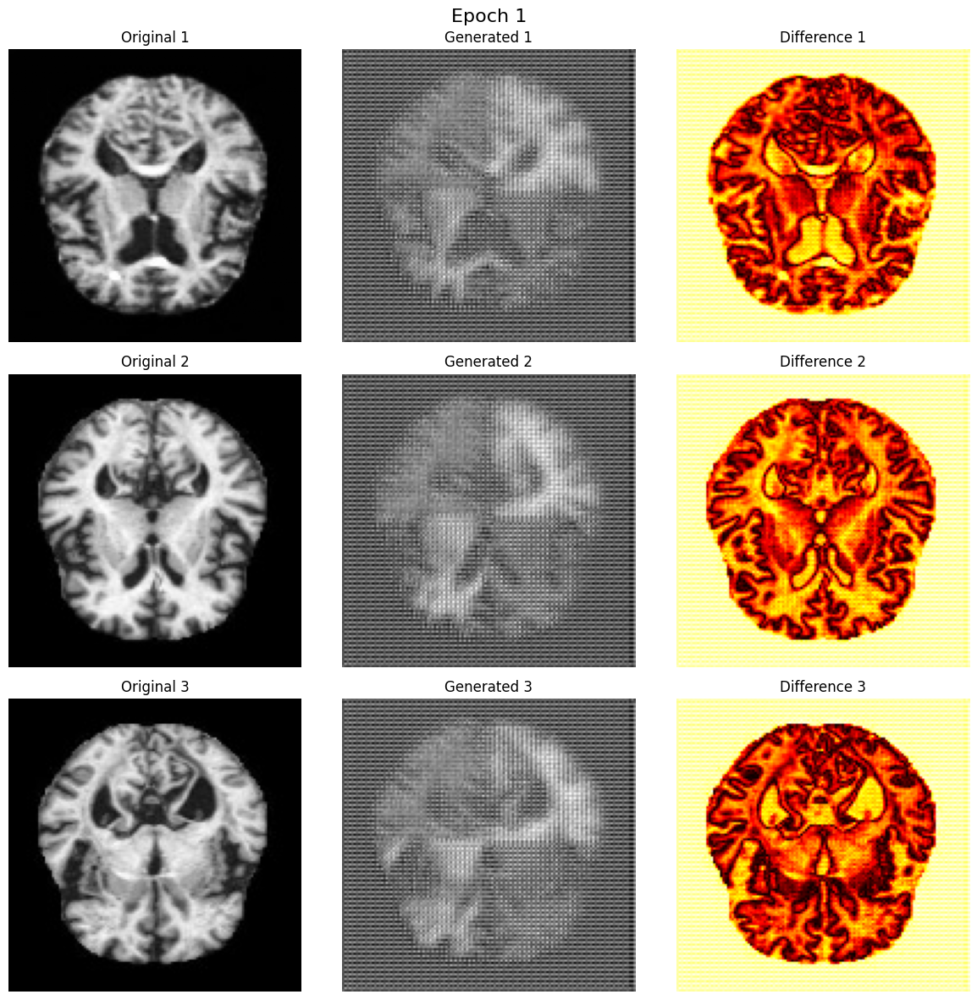


📊 Epoch 1 Metrics:
   Generator Loss: 17.4128
   Discriminator Loss: 0.8281
   SSIM Loss: 0.9820
   L2 Loss: 1.8471
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 4s/step - discriminator_loss: 1.1528 - generator_loss: 18.3793 - l2_loss: 1.8469 - ssim_loss: 0.9844
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - discriminator_loss: 0.0061 - generator_loss: 18.6596 - l2_loss: 1.8481 - ssim_loss: 0.9685
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - discriminator_loss: 0.0026 - generator_loss: 16.1152 - l2_loss: 1.8493 - ssim_loss: 0.9526
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 3s/step - discriminator_loss: 0.0558 - generator_loss: 13.6662 - l2_loss: 1.8504 - ssim_loss: 0.9359
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - discriminator_loss: 1.6789 - generator_loss: 23.1395 - l2_loss: 1.8513 - ssim_loss: 0.9237
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - discriminator_loss: 5.5798e-04 - generator_loss: 22.6238 - l2_loss: 1.8522 - ssim_loss: 0.9091

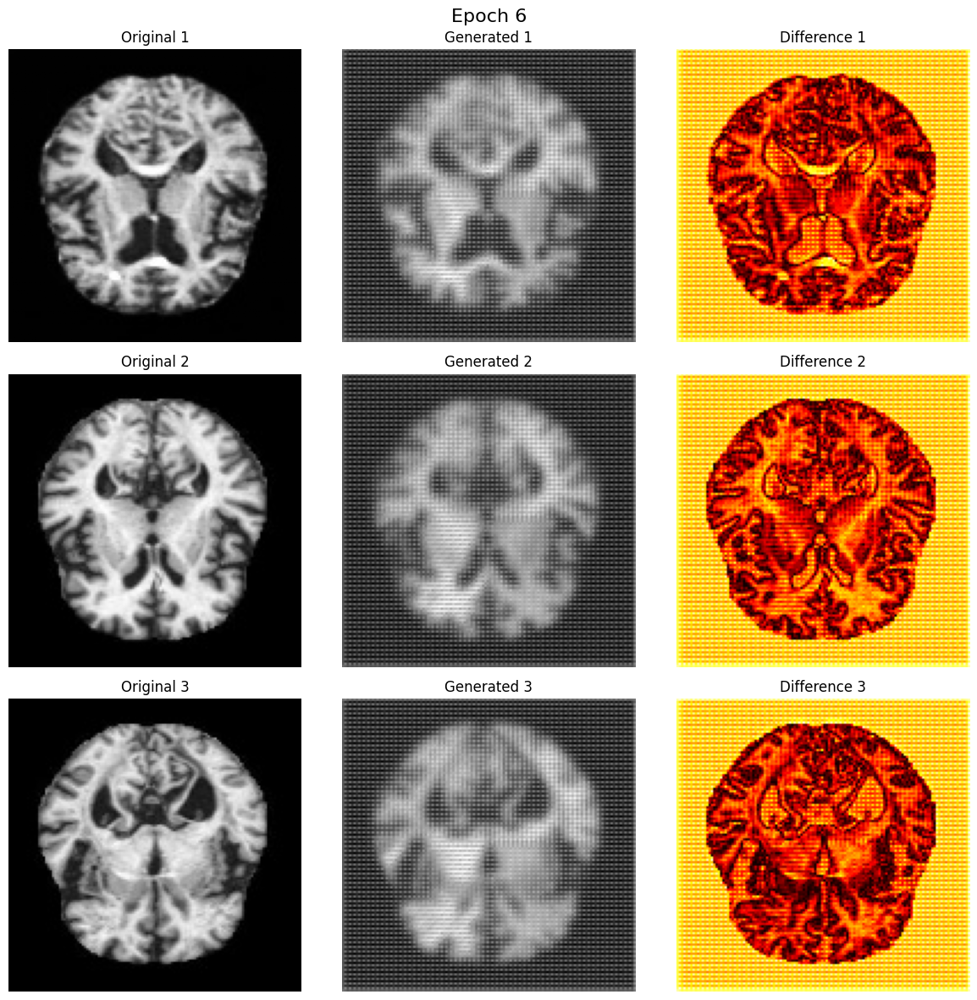


📊 Epoch 6 Metrics:
   Generator Loss: 24.2542
   Discriminator Loss: 0.0003
   SSIM Loss: 0.9059
   L2 Loss: 1.8524
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step - discriminator_loss: 4.9473e-04 - generator_loss: 23.0314 - l2_loss: 1.8522 - ssim_loss: 0.9083
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - discriminator_loss: 8.3726e-04 - generator_loss: 18.6843 - l2_loss: 1.8535 - ssim_loss: 0.8985
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - discriminator_loss: 1.3004 - generator_loss: 19.1148 - l2_loss: 1.8548 - ssim_loss: 0.8951
Epoch 9/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - discriminator_loss: 1.8599 - generator_loss: 39.5611 - l2_loss: 1.8558 - ssim_loss: 0.9003
Epoch 10/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - discriminator_loss: 0.1485 - generator_loss: 22.5636 - l2_loss: 1.8567 - ssim_loss: 0.8901
Epoch 11/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - discriminator_loss: 0.0869 - generator_loss: 23.7564 - l2_loss: 1.8576 - ssim_loss: 0.8724

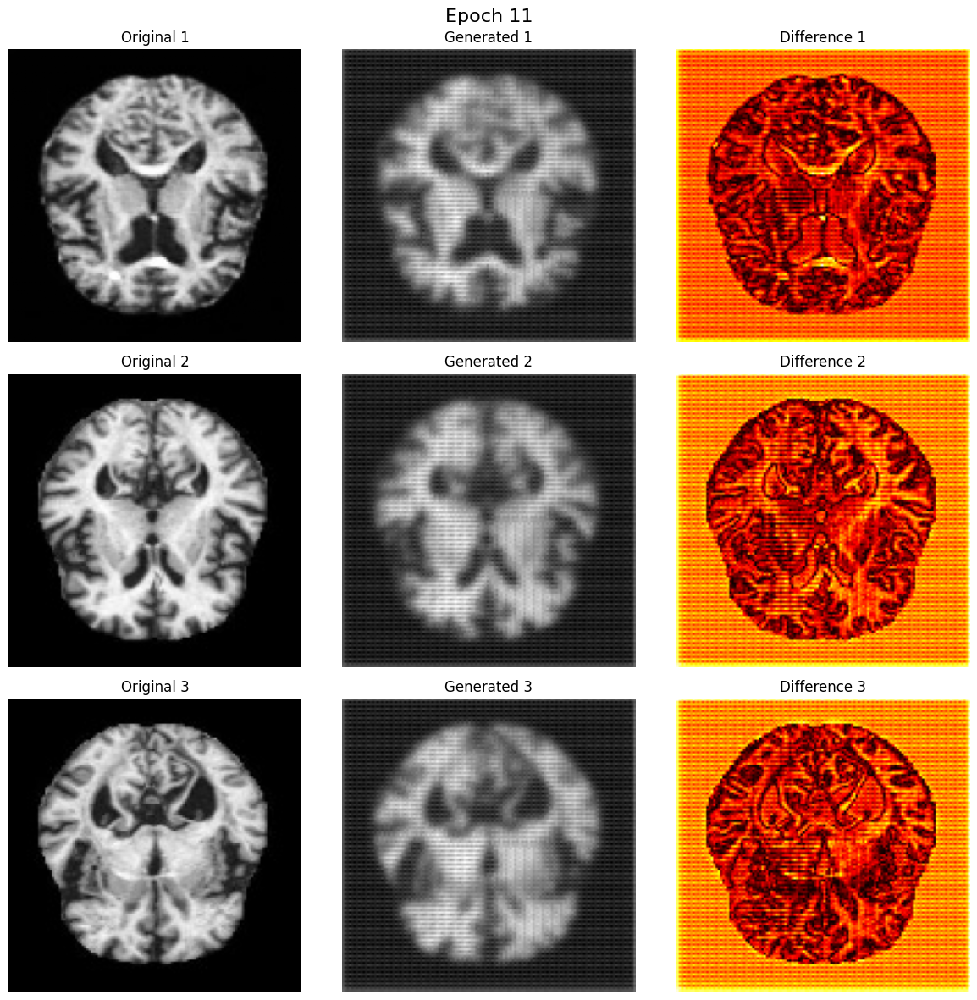


📊 Epoch 11 Metrics:
   Generator Loss: 19.9709
   Discriminator Loss: 0.0547
   SSIM Loss: 0.8680
   L2 Loss: 1.8578
3/3 ━━━━━━━━━━━━━━━━━━━━ 12s 4s/step - discriminator_loss: 0.0788 - generator_loss: 22.8101 - l2_loss: 1.8577 - ssim_loss: 0.8713
Epoch 12/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step - discriminator_loss: 0.0047 - generator_loss: 16.6978 - l2_loss: 1.8587 - ssim_loss: 0.8450
Epoch 13/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - discriminator_loss: 0.0207 - generator_loss: 20.6579 - l2_loss: 1.8599 - ssim_loss: 0.8451
Epoch 14/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - discriminator_loss: 7.4944 - generator_loss: 18.3387 - l2_loss: 1.8610 - ssim_loss: 0.8591
Epoch 15/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - discriminator_loss: 5.7096 - generator_loss: 15.9357 - l2_loss: 1.8619 - ssim_loss: 0.8357
Epoch 16/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - discriminator_loss: 0.8330 - generator_loss: 17.0402 - l2_loss: 1.8628 - ssim_loss: 0.8130

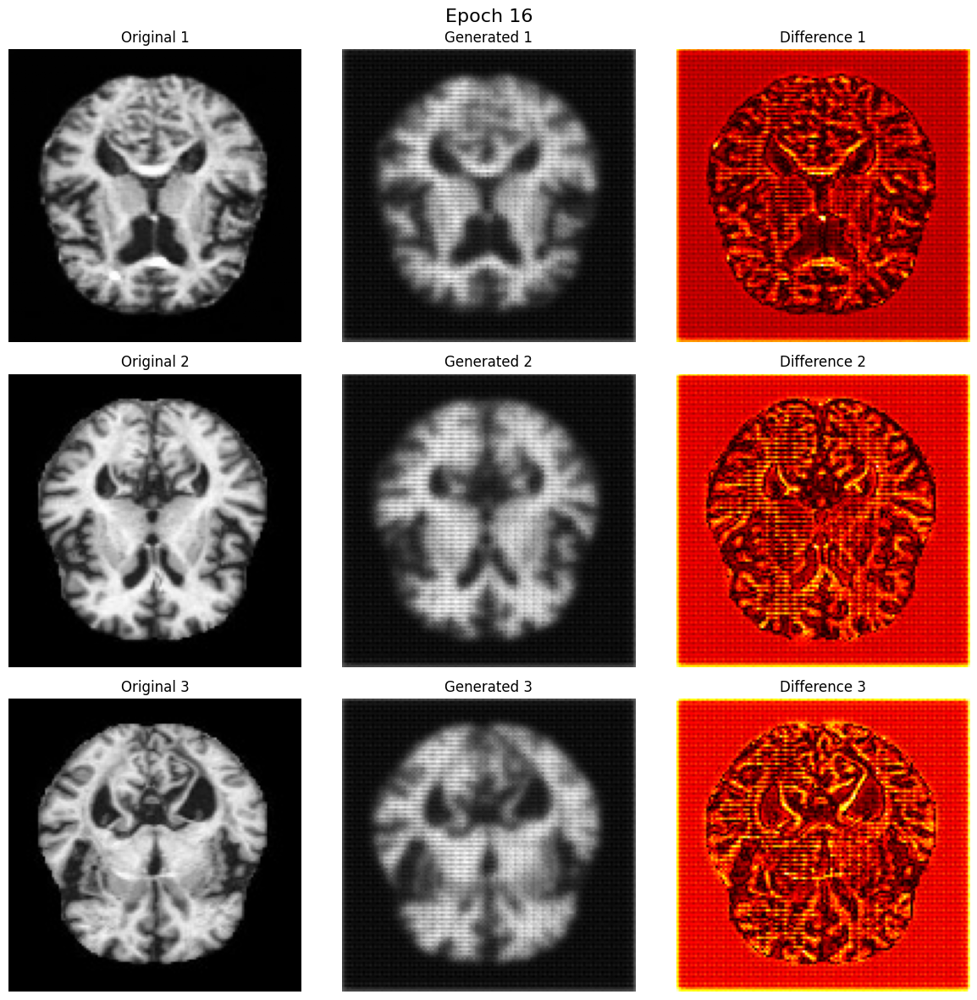


📊 Epoch 16 Metrics:
   Generator Loss: 15.3666
   Discriminator Loss: 0.5287
   SSIM Loss: 0.8095
   L2 Loss: 1.8630
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 3s/step - discriminator_loss: 0.7569 - generator_loss: 16.6218 - l2_loss: 1.8628 - ssim_loss: 0.8121
Epoch 17/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - discriminator_loss: 13.7426 - generator_loss: 25.9701 - l2_loss: 1.8640 - ssim_loss: 0.7810
Epoch 18/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - discriminator_loss: 0.0346 - generator_loss: 10.3945 - l2_loss: 1.8651 - ssim_loss: 0.7593
Epoch 19/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - discriminator_loss: 0.7405 - generator_loss: 21.7796 - l2_loss: 1.8661 - ssim_loss: 0.7399
Epoch 20/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 3s/step - discriminator_loss: 1.2999 - generator_loss: 25.9131 - l2_loss: 1.8669 - ssim_loss: 0.7250
Epoch 21/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - discriminator_loss: 0.9516 - generator_loss: 10.8744 - l2_loss: 1.8677 - ssim_loss: 0.6884

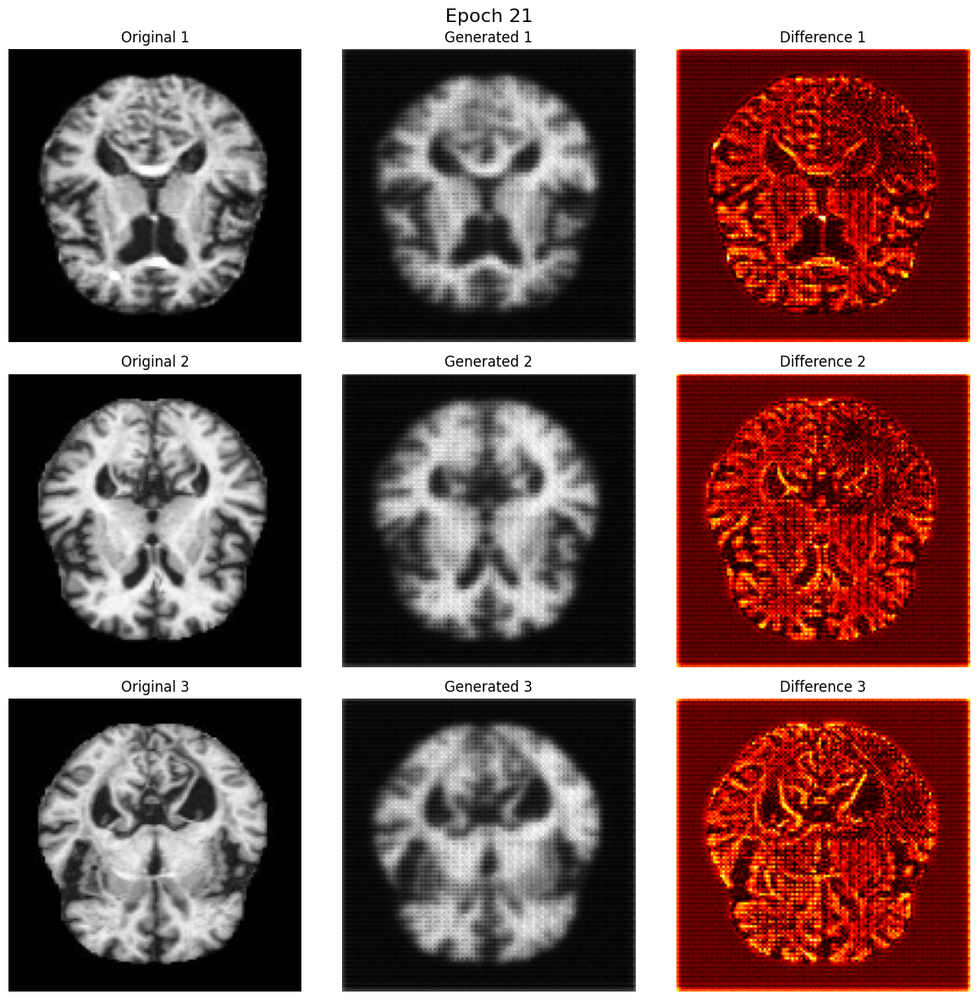


📊 Epoch 21 Metrics:
   Generator Loss: 13.0174
   Discriminator Loss: 0.5855
   SSIM Loss: 0.6854
   L2 Loss: 1.8678
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - discriminator_loss: 0.8601 - generator_loss: 11.4101 - l2_loss: 1.8677 - ssim_loss: 0.6877
Epoch 22/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - discriminator_loss: 0.0185 - generator_loss: 22.1102 - l2_loss: 1.8686 - ssim_loss: 0.6519
Epoch 23/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step - discriminator_loss: 0.5577 - generator_loss: 29.1137 - l2_loss: 1.8697 - ssim_loss: 0.6537
Epoch 24/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - discriminator_loss: 12.4882 - generator_loss: 16.2107 - l2_loss: 1.8707 - ssim_loss: 0.6608
Epoch 25/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - discriminator_loss: 0.5093 - generator_loss: 15.6683 - l2_loss: 1.8716 - ssim_loss: 0.5965
Epoch 26/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - discriminator_loss: 4.8711 - generator_loss: 31.4516 - l2_loss: 1.8726 - ssim_loss: 0.5285

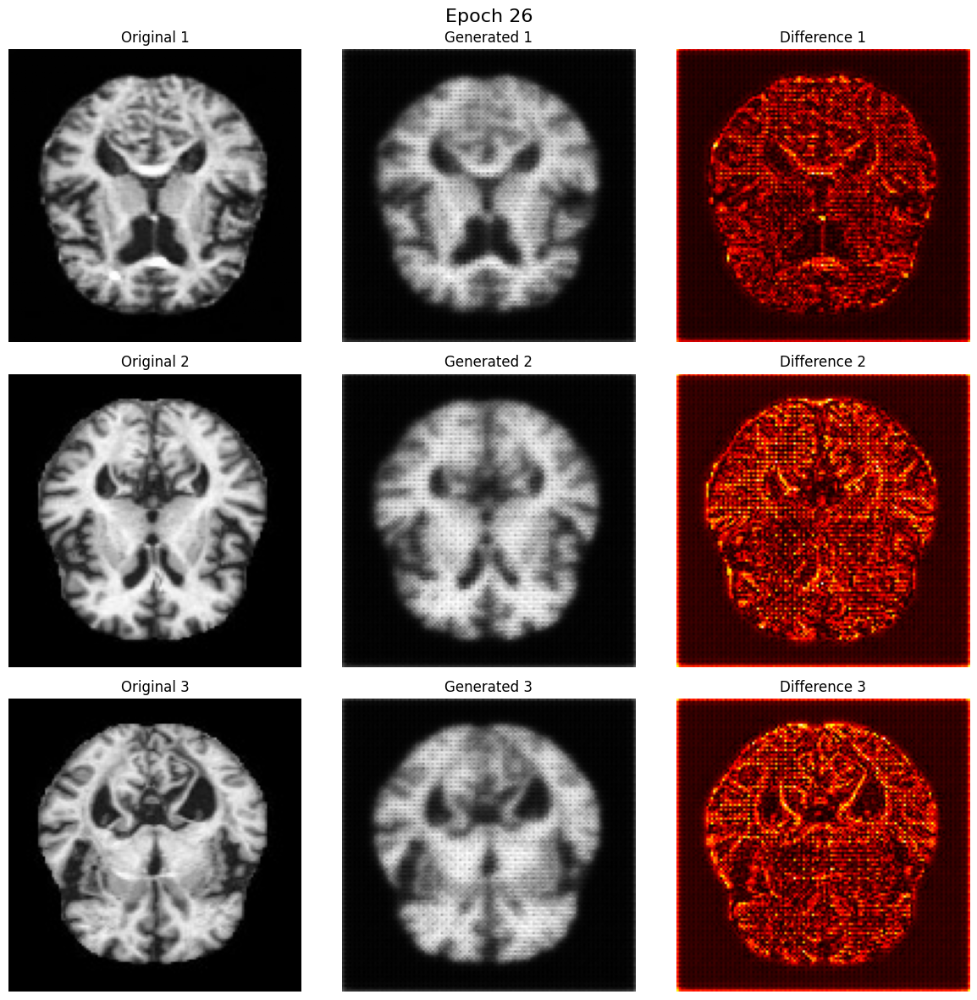


📊 Epoch 26 Metrics:
   Generator Loss: 23.7234
   Discriminator Loss: 3.7372
   SSIM Loss: 0.5311
   L2 Loss: 1.8727
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 4s/step - discriminator_loss: 4.5876 - generator_loss: 29.5196 - l2_loss: 1.8726 - ssim_loss: 0.5291
Epoch 27/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - discriminator_loss: 11.2790 - generator_loss: 17.5232 - l2_loss: 1.8734 - ssim_loss: 0.5024
Epoch 28/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - discriminator_loss: 0.1212 - generator_loss: 17.9720 - l2_loss: 1.8743 - ssim_loss: 0.5098
Epoch 29/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - discriminator_loss: 0.5186 - generator_loss: 30.3909 - l2_loss: 1.8751 - ssim_loss: 0.5483
Epoch 30/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step - discriminator_loss: 9.3204 - generator_loss: 10.3232 - l2_loss: 1.8760 - ssim_loss: 0.5286
Epoch 31/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - discriminator_loss: 0.0101 - generator_loss: 27.8624 - l2_loss: 1.8770 - ssim_loss: 0.4685

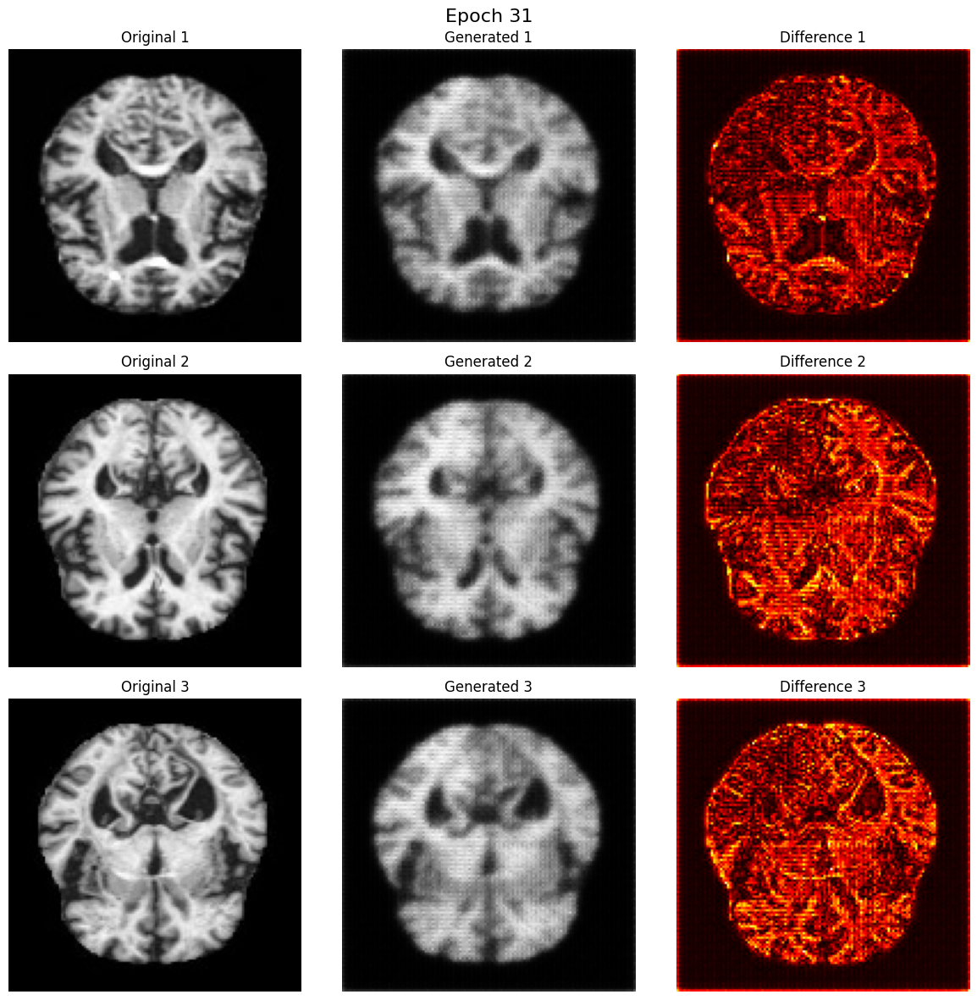


📊 Epoch 31 Metrics:
   Generator Loss: 24.2359
   Discriminator Loss: 0.0120
   SSIM Loss: 0.4632
   L2 Loss: 1.8772
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 4s/step - discriminator_loss: 0.0106 - generator_loss: 26.9558 - l2_loss: 1.8771 - ssim_loss: 0.4672
Epoch 32/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - discriminator_loss: 1.1656 - generator_loss: 16.9432 - l2_loss: 1.8782 - ssim_loss: 0.4350
Epoch 33/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - discriminator_loss: 9.2639 - generator_loss: 13.5804 - l2_loss: 1.8791 - ssim_loss: 0.4563
Epoch 34/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step - discriminator_loss: 5.6451 - generator_loss: 19.6905 - l2_loss: 1.8800 - ssim_loss: 0.4170
Epoch 35/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - discriminator_loss: 13.3774 - generator_loss: 13.8290 - l2_loss: 1.8808 - ssim_loss: 0.4105
Epoch 36/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - discriminator_loss: 10.1018 - generator_loss: 21.6145 - l2_loss: 1.8814 - ssim_loss: 0.3936

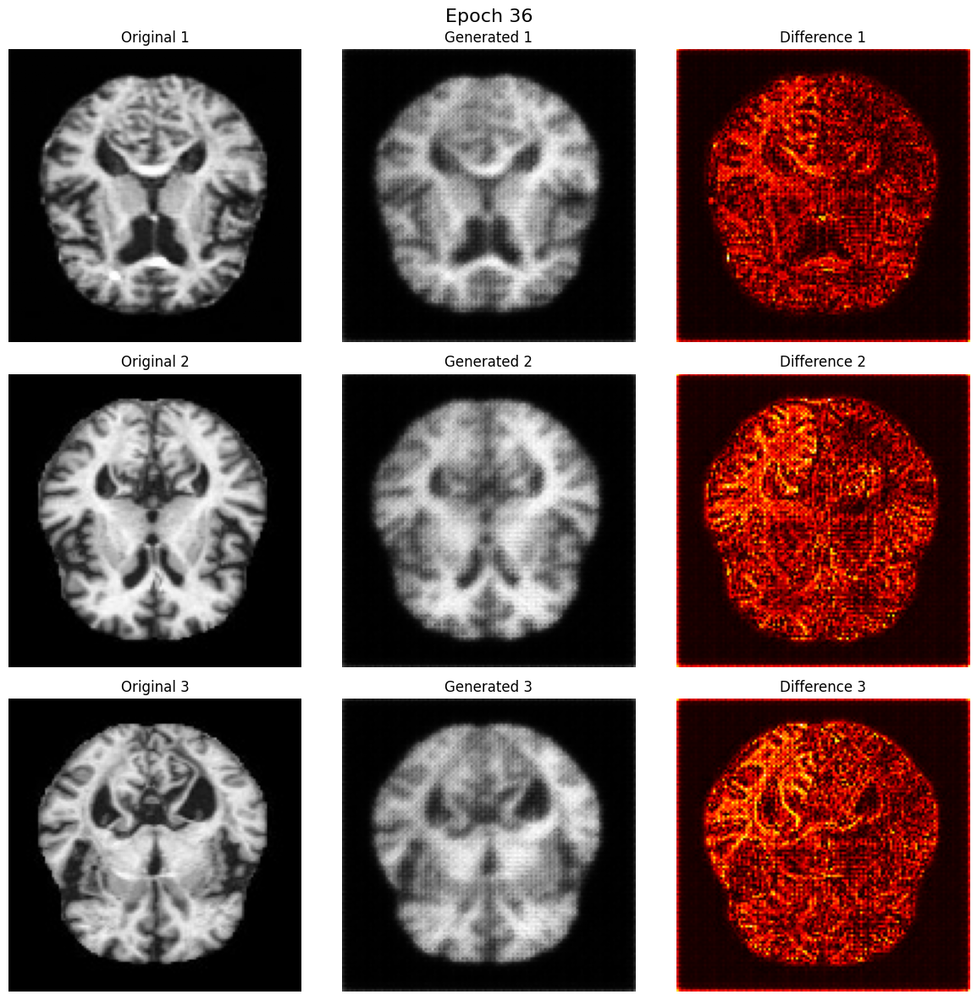


📊 Epoch 36 Metrics:
   Generator Loss: 14.4838
   Discriminator Loss: 8.0727
   SSIM Loss: 0.4082
   L2 Loss: 1.8815
3/3 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - discriminator_loss: 9.5946 - generator_loss: 19.8319 - l2_loss: 1.8814 - ssim_loss: 0.3972
Epoch 37/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - discriminator_loss: 10.6789 - generator_loss: 20.0605 - l2_loss: 1.8820 - ssim_loss: 0.4027
Epoch 38/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step - discriminator_loss: 9.2764 - generator_loss: 6.9729 - l2_loss: 1.8826 - ssim_loss: 0.3809
Epoch 39/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - discriminator_loss: 1.8242 - generator_loss: 13.3679 - l2_loss: 1.8831 - ssim_loss: 0.3652
Epoch 40/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - discriminator_loss: 0.3732 - generator_loss: 11.8376 - l2_loss: 1.8837 - ssim_loss: 0.3799
Epoch 41/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - discriminator_loss: 3.3247 - generator_loss: 5.9884 - l2_loss: 1.8843 - ssim_loss: 0.3779

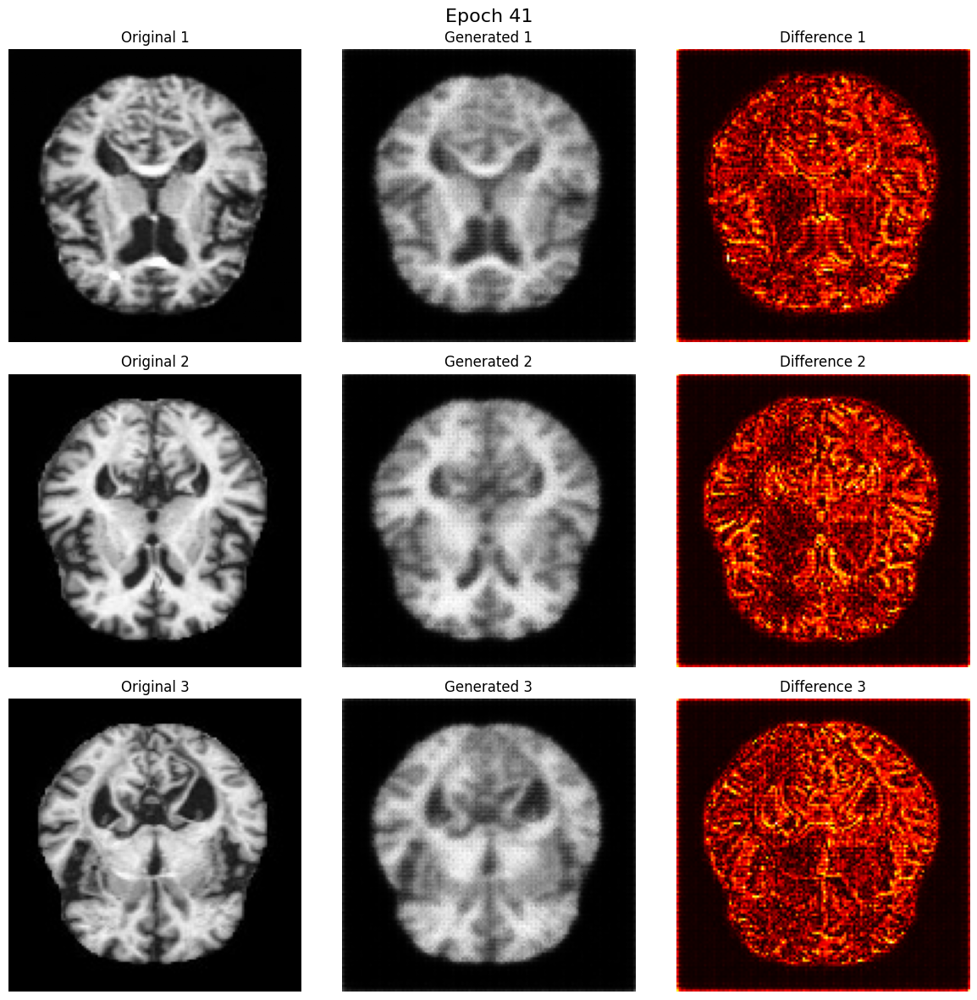


📊 Epoch 41 Metrics:
   Generator Loss: 9.0105
   Discriminator Loss: 5.5351
   SSIM Loss: 0.3793
   L2 Loss: 1.8844
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 4s/step - discriminator_loss: 3.8773 - generator_loss: 6.7439 - l2_loss: 1.8843 - ssim_loss: 0.3783
Epoch 42/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step - discriminator_loss: 5.9724 - generator_loss: 19.7414 - l2_loss: 1.8849 - ssim_loss: 0.3679
Epoch 43/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - discriminator_loss: 7.1282 - generator_loss: 11.1187 - l2_loss: 1.8855 - ssim_loss: 0.3705
Epoch 44/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - discriminator_loss: 4.4489 - generator_loss: 8.2331 - l2_loss: 1.8860 - ssim_loss: 0.3630
Epoch 45/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - discriminator_loss: 5.4610 - generator_loss: 11.3775 - l2_loss: 1.8864 - ssim_loss: 0.3388
Epoch 46/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - discriminator_loss: 10.4536 - generator_loss: 11.8419 - l2_loss: 1.8869 - ssim_loss: 0.3389

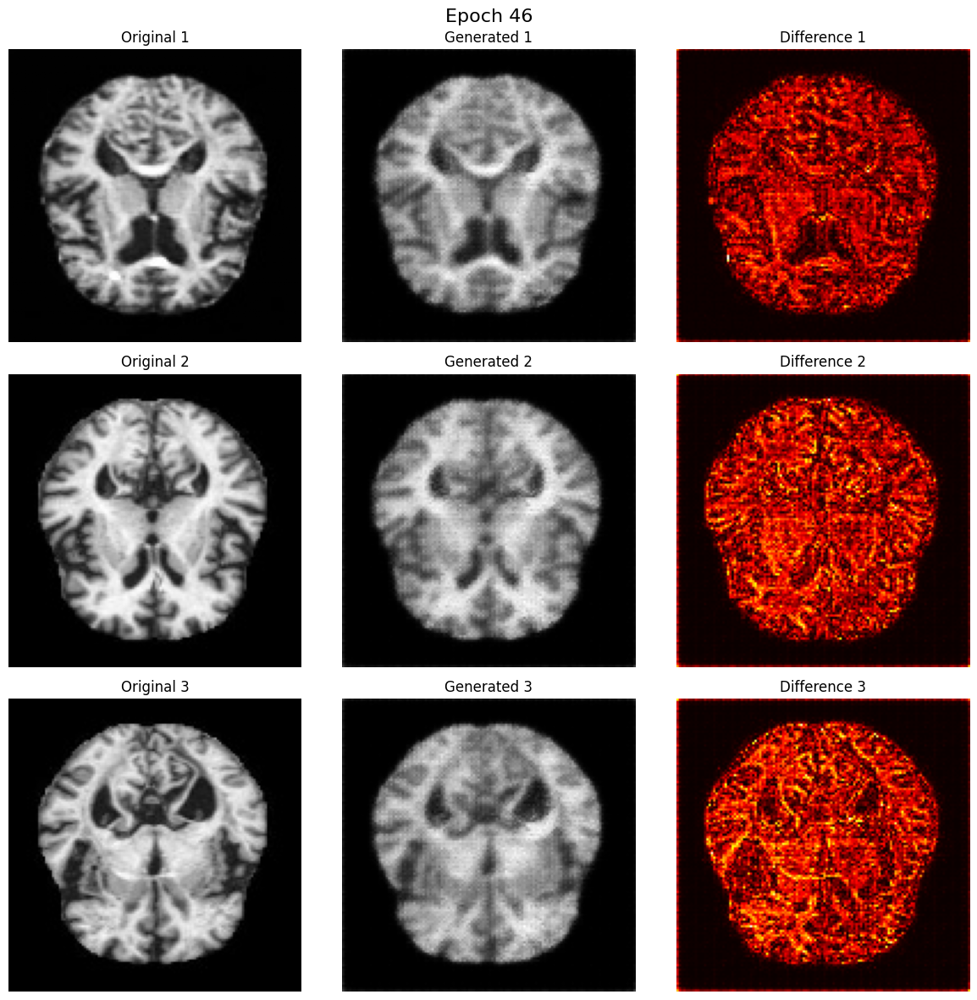


📊 Epoch 46 Metrics:
   Generator Loss: 8.9514
   Discriminator Loss: 7.6438
   SSIM Loss: 0.3463
   L2 Loss: 1.8870
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - discriminator_loss: 9.7512 - generator_loss: 11.1193 - l2_loss: 1.8870 - ssim_loss: 0.3408
Epoch 47/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - discriminator_loss: 5.2821 - generator_loss: 11.4337 - l2_loss: 1.8876 - ssim_loss: 0.3300
Epoch 48/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - discriminator_loss: 2.7477 - generator_loss: 12.5331 - l2_loss: 1.8882 - ssim_loss: 0.3118
Epoch 49/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - discriminator_loss: 3.1786 - generator_loss: 11.4360 - l2_loss: 1.8889 - ssim_loss: 0.2801
Epoch 50/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - discriminator_loss: 2.5169 - generator_loss: 11.2820 - l2_loss: 1.8894 - ssim_loss: 0.3004
✅ Training completed!


In [14]:
# Step 11: Train the TriNet GAN Model
print("Starting GAN training...")

# Since we only have 5 images, we'll train for a small number of epochs
epochs = 50
print(f"Training for {epochs} epochs with {len(original_imgs)} images...")

# Train the model
history = trinet_gan.fit(
    train_dataset,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

print("✅ Training completed!")

Plotting training history...


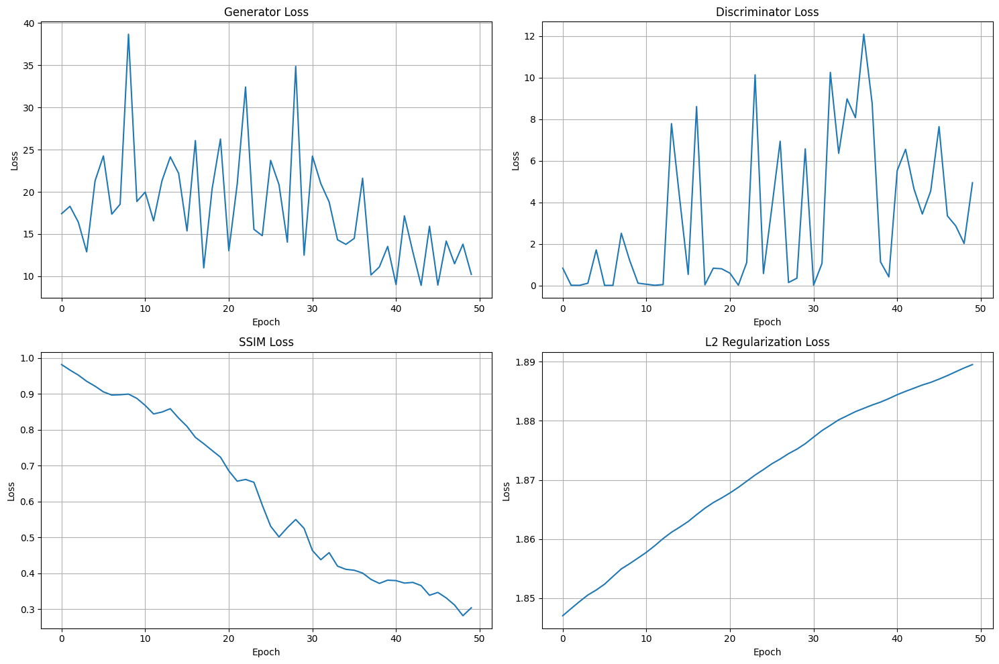

In [15]:
# Step 12: Plot Training History
print("Plotting training history...")

def plot_training_history(history):
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))

    # Generator loss
    axes[0, 0].plot(history.history['generator_loss'])
    axes[0, 0].set_title('Generator Loss')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].grid(True)

    # Discriminator loss
    axes[0, 1].plot(history.history['discriminator_loss'])
    axes[0, 1].set_title('Discriminator Loss')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].grid(True)

    # SSIM loss
    axes[1, 0].plot(history.history['ssim_loss'])
    axes[1, 0].set_title('SSIM Loss')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Loss')
    axes[1, 0].grid(True)

    # L2 loss
    axes[1, 1].plot(history.history['l2_loss'])
    axes[1, 1].set_title('L2 Regularization Loss')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('Loss')
    axes[1, 1].grid(True)

    plt.tight_layout()
    plt.show()

# Plot the training history
plot_training_history(history)

Evaluating the trained model...
📊 Model Evaluation Results:
   Average SSIM: 0.8450 ± 0.0085
   Average MSE: 0.0189 ± 0.0007
   Best SSIM: 0.8549
   Worst SSIM: 0.8336


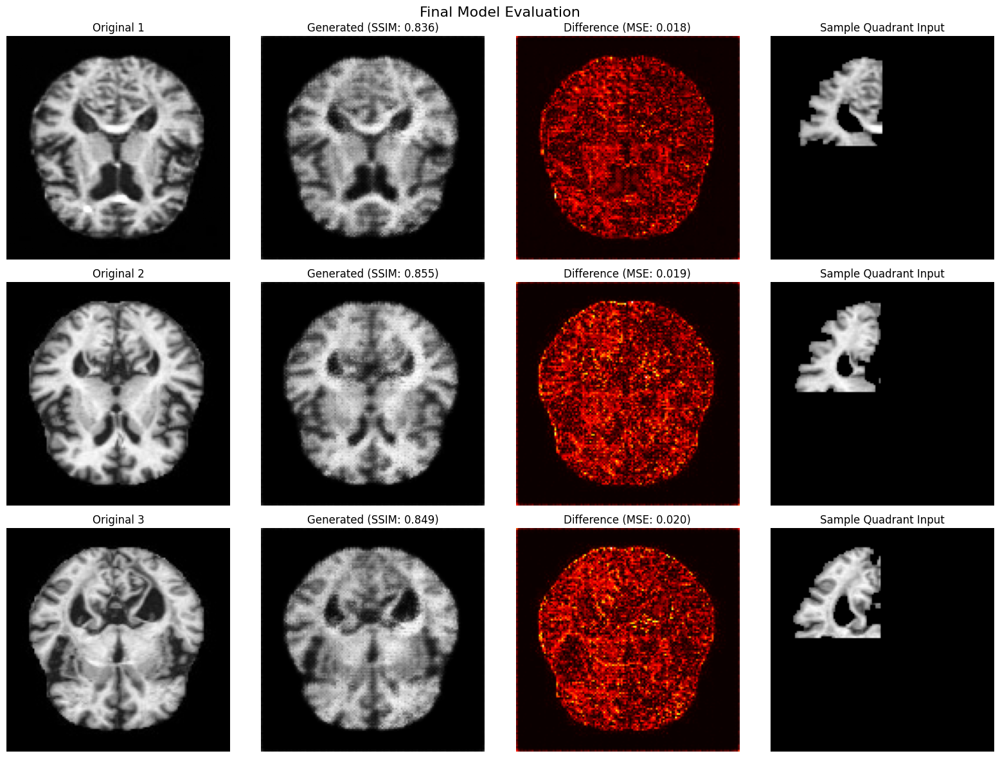

In [16]:
# Step 13: Evaluate the Model
print("Evaluating the trained model...")

def evaluate_model(generator, original_imgs, quadrant_imgs):
    """Evaluate the trained generator model"""
    # Prepare test data
    test_original = original_imgs[..., np.newaxis]  # Add channel dimension

    # Stack quadrants
    test_quadrants = []
    for i in range(len(quadrant_imgs)):
        stacked = np.stack(quadrant_imgs[i], axis=-1)
        test_quadrants.append(stacked)
    test_quadrants = np.array(test_quadrants)

    # Generate images
    generated_imgs = generator([test_original, test_quadrants], training=False)

    # Calculate metrics
    ssim_scores = []
    mse_scores = []

    for i in range(len(original_imgs)):
        # Calculate SSIM
        ssim_val = tf.image.ssim(
            tf.cast((test_original[i] + 1.0) / 2.0 * 2.0, tf.float32),
            tf.cast((generated_imgs[i] + 1.0) / 2.0 * 2.0, tf.float32),
            max_val=2.0
        )
        ssim_scores.append(ssim_val.numpy()) # Append numpy value

        # Calculate MSE - Specify reduction='mean' to get a scalar loss per image
        mse = tf.keras.losses.MSE(test_original[i], generated_imgs[i])
        mse = tf.reduce_mean(mse) # Explicitly take mean to ensure scalar
        mse_scores.append(mse.numpy()) # Append numpy value

    print("📊 Model Evaluation Results:")
    # Access scalar values using .item() for printing
    print(f"   Average SSIM: {np.mean(ssim_scores).item():.4f} ± {np.std(ssim_scores).item():.4f}")
    print(f"   Average MSE: {np.mean(mse_scores).item():.4f} ± {np.std(mse_scores).item():.4f}")
    print(f"   Best SSIM: {np.max(ssim_scores).item():.4f}")
    print(f"   Worst SSIM: {np.min(ssim_scores).item():.4f}")


    # Visualize final results
    num_samples = min(3, len(original_imgs))
    fig, axes = plt.subplots(num_samples, 4, figsize=(16, 4 * num_samples))

    for i in range(num_samples):
        if num_samples == 1:
            ax_orig, ax_gen, ax_diff, ax_quad = axes[0], axes[1], axes[2], axes[3]
        else:
            ax_orig, ax_gen, ax_diff, ax_quad = axes[i, 0], axes[i, 1], axes[i, 2], axes[i, 3]

        # Original
        ax_orig.imshow(test_original[i, :, :, 0] * 0.5 + 0.5, cmap='gray')
        ax_orig.set_title(f'Original {i+1}')
        ax_orig.axis('off')

        # Generated
        # Access scalar values using .item() for plot titles
        ax_gen.imshow(generated_imgs[i, :, :, 0] * 0.5 + 0.5, cmap='gray')
        ax_gen.set_title(f'Generated (SSIM: {ssim_scores[i].item():.3f})')
        ax_gen.axis('off')

        # Difference
        diff = np.abs(test_original[i, :, :, 0] - generated_imgs[i, :, :, 0])
        # Access scalar values using .item() for plot titles
        ax_diff.imshow(diff, cmap='hot')
        ax_diff.set_title(f'Difference (MSE: {mse_scores[i].item():.3f})')
        ax_diff.axis('off')

        # Sample quadrant (first quadrant)
        ax_quad.imshow(test_quadrants[i, :, :, 0] * 0.5 + 0.5, cmap='gray')
        ax_quad.set_title('Sample Quadrant Input')
        ax_quad.axis('off')

    plt.suptitle('Final Model Evaluation', fontsize=16)
    plt.tight_layout()
    plt.show()

    return ssim_scores, mse_scores

# Evaluate the model
ssim_scores, mse_scores = evaluate_model(generator, original_imgs, quadrant_imgs)

In [17]:
# Step 14: Save the Trained Model
print("Saving the trained model...")

def save_models(generator, discriminator, save_path='/content/trained_models'):
    """Save the trained generator and discriminator"""
    import os
    os.makedirs(save_path, exist_ok=True)

    generator.save(f'{save_path}/generator.h5')
    discriminator.save(f'{save_path}/discriminator.h5')

    print(f"✅ Models saved successfully in: {save_path}")
    print(f"   - Generator: {save_path}/generator.h5")
    print(f"   - Discriminator: {save_path}/discriminator.h5")

# Save the models
save_models(generator, discriminator)

# Function to load models (for future use)
def load_models(save_path='/content/trained_models'):
    """Load saved generator and discriminator"""
    generator = tf.keras.models.load_model(f'{save_path}/generator.h5')
    discriminator = tf.keras.models.load_model(f'{save_path}/discriminator.h5')
    print("✅ Models loaded successfully!")
    return generator, discriminator

print("\n🎉 TriNet GAN Framework Implementation Complete!")
print("Next steps:")
print("1. Monitor the training progress through the generated images")
print("2. Analyze the loss curves to ensure stable training")
print("3. Evaluate the final model quality using SSIM and MSE metrics")
print("4. For better results, use more training data and train for more epochs")

Saving the trained model...


✅ Models saved successfully in: /content/trained_models
   - Generator: /content/trained_models/generator.h5
   - Discriminator: /content/trained_models/discriminator.h5

🎉 TriNet GAN Framework Implementation Complete!
Next steps:
1. Monitor the training progress through the generated images
2. Analyze the loss curves to ensure stable training
3. Evaluate the final model quality using SSIM and MSE metrics
4. For better results, use more training data and train for more epochs


In [18]:
# Step 18: Extract fg and fd features from GAN for UNet
print("Extracting precise fg and fd features from GAN for UNet...")

def get_gan_features_for_unet(generator, discriminator):
    """
    Extract the exact features needed for UNet:
    - fg: Features from generator's last layer before output
    - fd: Features from discriminator's last layer before output
    """

    # 1. Extract fg from Generator (last layer before output)
    print("Extracting fg features from Generator...")

    # Get all layers from generator
    generator_layers = [(i, layer.name, type(layer).__name__)
                       for i, layer in enumerate(generator.layers)]

    print("Generator layers:")
    for i, name, layer_type in generator_layers:
        print(f"  {i:2d}: {name:30} ({layer_type})")

    # Find the last layer before the final output
    # Typically this is the second-to-last layer
    if len(generator.layers) >= 2:
        fg_layer = generator.layers[-2]  # Layer before output
        print(f"✅ Selected fg layer: {fg_layer.name} (index {len(generator.layers)-2})")
    else:
        fg_layer = generator.layers[-1]
        print(f"⚠️  Using last layer for fg: {fg_layer.name}")

    # Create fg feature extractor
    fg_extractor = tf.keras.Model(
        inputs=generator.inputs,
        outputs=fg_layer.output,
        name="fg_feature_extractor"
    )

    # 2. Extract fd from Discriminator (last layer before output)
    print("\nExtracting fd features from Discriminator...")

    # Get all layers from discriminator
    discriminator_layers = [(i, layer.name, type(layer).__name__)
                           for i, layer in enumerate(discriminator.layers)]

    print("Discriminator layers:")
    for i, name, layer_type in discriminator_layers:
        print(f"  {i:2d}: {name:30} ({layer_type})")

    # Find the last layer before the final output (classification)
    if len(discriminator.layers) >= 2:
        fd_layer = discriminator.layers[-2]  # Layer before output
        print(f"✅ Selected fd layer: {fd_layer.name} (index {len(discriminator.layers)-2})")
    else:
        fd_layer = discriminator.layers[-1]
        print(f"⚠️  Using last layer for fd: {fd_layer.name}")

    # Create fd feature extractor
    fd_extractor = tf.keras.Model(
        inputs=discriminator.input,
        outputs=fd_layer.output,
        name="fd_feature_extractor"
    )

    return fg_extractor, fd_extractor

# Extract the precise features
fg_extractor, fd_extractor = get_gan_features_for_unet(generator, discriminator)

print("✅ Feature extractors created successfully!")

Extracting precise fg and fd features from GAN for UNet...
Extracting fg features from Generator...
Generator layers:
   0: original_input                 (InputLayer)
   1: quadrant_input                 (InputLayer)
   2: concatenate                    (Concatenate)
   3: conv2d                         (Conv2D)
   4: leaky_re_lu                    (LeakyReLU)
   5: conv2d_1                       (Conv2D)
   6: leaky_re_lu_1                  (LeakyReLU)
   7: dropout                        (Dropout)
   8: conv2d_2                       (Conv2D)
   9: batch_normalization            (BatchNormalization)
  10: leaky_re_lu_2                  (LeakyReLU)
  11: dropout_1                      (Dropout)
  12: conv2d_3                       (Conv2D)
  13: batch_normalization_1          (BatchNormalization)
  14: leaky_re_lu_3                  (LeakyReLU)
  15: dropout_2                      (Dropout)
  16: conv2d_4                       (Conv2D)
  17: batch_normalization_2          (BatchNorma

In [19]:
# Step 19: Test fg and fd feature extraction
print("Testing fg and fd feature extraction with actual data...")

# Take a sample batch from your dataset
for test_orig, test_quad in train_dataset.take(1):
    print(f"Input shapes - Original: {test_orig.shape}, Quadrants: {test_quad.shape}")

    # Extract fg features from Generator
    fg_features = fg_extractor([test_orig, test_quad])
    print(f"✅ fg features shape: {fg_features.shape}")
    print(f"✅ fg features range: [{fg_features.numpy().min():.3f}, {fg_features.numpy().max():.3f}]")

    # Generate an image using the generator
    generated_image = generator([test_orig, test_quad])
    print(f"Generated image shape: {generated_image.shape}")

    # Extract fd features from Discriminator using the generated image
    fd_features = fd_extractor(generated_image)
    print(f"✅ fd features shape: {fd_features.shape}")
    print(f"✅ fd features range: [{fd_features.numpy().min():.3f}, {fd_features.numpy().max():.3f}]")

    # Also test with real image for comparison
    fd_features_real = fd_extractor(test_orig)
    print(f"✅ fd features (real image) shape: {fd_features_real.shape}")

    break

print("\n🎯 fg and fd feature extraction working correctly!")

Testing fg and fd feature extraction with actual data...
Input shapes - Original: (2, 128, 128, 1), Quadrants: (2, 128, 128, 4)
✅ fg features shape: (2, 128, 128, 64)
✅ fg features range: [-0.943, 4.445]
Generated image shape: (2, 128, 128, 1)
✅ fd features shape: (2, 1024)
✅ fd features range: [-1.671, 19.374]
✅ fd features (real image) shape: (2, 1024)

🎯 fg and fd feature extraction working correctly!


In [20]:
# Step 20: Create GANFeatureProvider for UNet
print("Creating GANFeatureProvider class for UNet...")

class GANFeatureProvider:
    """
    Provides fg and fd features from GAN for UNet training
    """

    def __init__(self, generator, discriminator, fg_extractor, fd_extractor):
        self.generator = generator
        self.discriminator = discriminator
        self.fg_extractor = fg_extractor
        self.fd_extractor = fd_extractor

        # Store feature shapes for UNet design
        self.fg_shape = None
        self.fd_shape = None
        self._initialize_feature_shapes()

    def _initialize_feature_shapes(self):
        """Initialize feature shapes using dummy data"""
        print("Initializing feature shapes...")
        dummy_original = tf.random.normal([1, 128, 128, 1])
        dummy_quadrant = tf.random.normal([1, 128, 128, 4])

        # Get fg features shape
        fg_dummy = self.fg_extractor([dummy_original, dummy_quadrant])
        self.fg_shape = fg_dummy.shape[1:]  # Remove batch dimension

        # Get fd features shape
        generated_dummy = self.generator([dummy_original, dummy_quadrant])
        fd_dummy = self.fd_extractor(generated_dummy)
        self.fd_shape = fd_dummy.shape[1:]  # Remove batch dimension

        print(f"✅ fg shape: {self.fg_shape}")
        print(f"✅ fd shape: {self.fd_shape}")

    def get_features(self, original_images, quadrant_images=None):
        """
        Extract fg and fd features for a batch of images

        Args:
            original_images: Batch of original MRI images (batch_size, 128, 128, 1)
            quadrant_images: Batch of quadrant images (batch_size, 128, 128, 4)
                           If None, creates dummy quadrants

        Returns:
            fg_features: Features from generator (batch_size, *fg_shape)
            fd_features: Features from discriminator (batch_size, *fd_shape)
        """

        if quadrant_images is None:
            batch_size = original_images.shape[0]
            quadrant_images = tf.zeros([batch_size, 128, 128, 4])
            print("⚠️  Using dummy quadrant images (all zeros)")

        # Extract fg features from generator
        fg_features = self.fg_extractor([original_images, quadrant_images])

        # Generate images for discriminator input
        generated_images = self.generator([original_images, quadrant_images])

        # Extract fd features from discriminator
        fd_features = self.fd_extractor(generated_images)

        return fg_features, fd_features

    def get_features_single(self, original_image, quadrant_image=None):
        """
        Extract features for a single image
        """
        # Add batch dimension
        original_image = tf.expand_dims(original_image, axis=0)

        if quadrant_image is not None:
            quadrant_image = tf.expand_dims(quadrant_image, axis=0)
        else:
            quadrant_image = tf.zeros([1, 128, 128, 4])

        fg, fd = self.get_features(original_image, quadrant_image)

        # Remove batch dimension
        return fg[0], fd[0]

    def get_feature_info(self):
        """Get complete information about features for UNet design"""
        return {
            'fg_shape': self.fg_shape,
            'fd_shape': self.fd_shape,
            'fg_layer': self.fg_extractor.output.name,
            'fd_layer': self.fd_extractor.output.name
        }

# Create the feature provider
feature_provider = GANFeatureProvider(generator, discriminator, fg_extractor, fd_extractor)

# Display feature information
feature_info = feature_provider.get_feature_info()
print("\n📊 GAN FEATURE INFORMATION FOR UNET:")
print("=" * 50)
print(f"fg (Generator Features):")
print(f"  Shape: {feature_info['fg_shape']}")
print(f"  Source: {feature_info['fg_layer']}")
print(f"  Type: Spatial features from generator")
print()
print(f"fd (Discriminator Features):")
print(f"  Shape: {feature_info['fd_shape']}")
print(f"  Source: {feature_info['fd_layer']}")
print(f"  Type: Discriminative features from discriminator")
print("=" * 50)

Creating GANFeatureProvider class for UNet...
Initializing feature shapes...
✅ fg shape: (128, 128, 64)
✅ fd shape: (1024,)

📊 GAN FEATURE INFORMATION FOR UNET:
fg (Generator Features):
  Shape: (128, 128, 64)
  Source: keras_tensor_55
  Type: Spatial features from generator

fd (Discriminator Features):
  Shape: (1024,)
  Source: keras_tensor_75
  Type: Discriminative features from discriminator


In [21]:
# Step 21: Save Feature Extractors for UNet
print("Saving feature extractors for UNet...")

def save_gan_features_for_unet(feature_provider, save_path='/content/gan_features_for_unet'):
    """Save all components needed for UNet feature extraction"""
    import os
    os.makedirs(save_path, exist_ok=True)

    # Save the feature extractors
    feature_provider.fg_extractor.save(f'{save_path}/fg_extractor.h5')
    feature_provider.fd_extractor.save(f'{save_path}/fd_extractor.h5')

    # Save the full models (for generation if needed)
    feature_provider.generator.save(f'{save_path}/generator.h5')
    feature_provider.discriminator.save(f'{save_path}/discriminator.h5')

    # Save feature information
    feature_info = feature_provider.get_feature_info()
    np.save(f'{save_path}/feature_info.npy', feature_info)

    # Create a summary file
    with open(f'{save_path}/feature_summary.txt', 'w') as f:
        f.write("GAN FEATURES FOR UNET - SUMMARY\n")
        f.write("=" * 40 + "\n")
        f.write(f"fg_shape: {feature_info['fg_shape']}\n")
        f.write(f"fg_source: {feature_info['fg_layer']}\n")
        f.write(f"fd_shape: {feature_info['fd_shape']}\n")
        f.write(f"fd_source: {feature_info['fd_layer']}\n")
        f.write("\nUSAGE IN UNET:\n")
        f.write("- fg: Concatenate with decoder features during upsampling\n")
        f.write("- fd: Incorporate in decoder (may need reshaping)\n")

    print(f"✅ GAN features saved in: {save_path}")
    print(f"   - fg_extractor.h5: Generator feature extractor")
    print(f"   - fd_extractor.h5: Discriminator feature extractor")
    print(f"   - generator.h5: Full generator model")
    print(f"   - discriminator.h5: Full discriminator model")
    print(f"   - feature_info.npy: Feature shapes and information")
    print(f"   - feature_summary.txt: Usage instructions")

# Save everything
save_gan_features_for_unet(feature_provider)

# Function to load features for UNet
def load_gan_features_for_unet(save_path='/content/gan_features_for_unet'):
    """Load saved GAN features for UNet"""
    fg_extractor = tf.keras.models.load_model(f'{save_path}/fg_extractor.h5')
    fd_extractor = tf.keras.models.load_model(f'{save_path}/fd_extractor.h5')
    generator = tf.keras.models.load_model(f'{save_path}/generator.h5')
    discriminator = tf.keras.models.load_model(f'{save_path}/discriminator.h5')
    feature_info = np.load(f'{save_path}/feature_info.npy', allow_pickle=True).item()

    feature_provider = GANFeatureProvider(generator, discriminator, fg_extractor, fd_extractor)

    print("✅ GAN features loaded successfully for UNet!")
    return feature_provider, feature_info

Saving feature extractors for UNet...


✅ GAN features saved in: /content/gan_features_for_unet
   - fg_extractor.h5: Generator feature extractor
   - fd_extractor.h5: Discriminator feature extractor
   - generator.h5: Full generator model
   - discriminator.h5: Full discriminator model
   - feature_info.npy: Feature shapes and information
   - feature_summary.txt: Usage instructions


In [22]:
# Step 22: Final Verification of GAN Features for UNet
print("Final verification of GAN features for UNet...")

# Test with your actual data
print("Testing with actual MRI data...")
for test_orig, test_quad in train_dataset.take(1):
    # Get features using the provider
    fg, fd = feature_provider.get_features(test_orig, test_quad)

    print("✅ FINAL FEATURE VERIFICATION:")
    print(f"   Input MRI shape: {test_orig.shape}")
    print(f"   fg features shape: {fg.shape}")
    print(f"   fd features shape: {fd.shape}")
    print(f"   fg dtype: {fg.dtype}")
    print(f"   fd dtype: {fd.dtype}")

    # Verify features are valid
    assert not np.isnan(fg.numpy()).any(), "fg features contain NaN!"
    assert not np.isnan(fd.numpy()).any(), "fd features contain NaN!"
    assert fg.shape[0] == test_orig.shape[0], "Batch size mismatch in fg!"
    assert fd.shape[0] == test_orig.shape[0], "Batch size mismatch in fd!"

    print("🎉 ALL CHECKS PASSED! GAN features are ready for UNet.")
    break

print("\n" + "="*60)
print("🎯 GAN FEATURE EXTRACTION COMPLETE!")
print("="*60)
print("You now have:")
print("1. fg_extractor - Gets features from generator's last layer before output")
print("2. fd_extractor - Gets features from discriminator's last layer before output")
print("3. feature_provider - Easy-to-use interface for feature extraction")
print("4. All models saved for UNet integration")
print("\nReady to implement UNet with:")
print("- Encoder: Original MRI images only")
print("- Decoder: Concatenated fg + fd features during upsampling")
print("- Skip connections: From encoder to decoder")
print("- Output: Segmentation mask + fu features for classification")
print("="*60)

Final verification of GAN features for UNet...
Testing with actual MRI data...
✅ FINAL FEATURE VERIFICATION:
   Input MRI shape: (2, 128, 128, 1)
   fg features shape: (2, 128, 128, 64)
   fd features shape: (2, 1024)
   fg dtype: <dtype: 'float32'>
   fd dtype: <dtype: 'float32'>
🎉 ALL CHECKS PASSED! GAN features are ready for UNet.

🎯 GAN FEATURE EXTRACTION COMPLETE!
You now have:
1. fg_extractor - Gets features from generator's last layer before output
2. fd_extractor - Gets features from discriminator's last layer before output
3. feature_provider - Easy-to-use interface for feature extraction
4. All models saved for UNet integration

Ready to implement UNet with:
- Encoder: Original MRI images only
- Decoder: Concatenated fg + fd features during upsampling
- Skip connections: From encoder to decoder
- Output: Segmentation mask + fu features for classification


In [23]:
# Step 23-24: Build UNet using Pure Functional API (FIXED)
print("Building UNet using pure Functional API...")

def build_alzheimer_unet(input_shape=(128, 128, 1), fg_shape=(128, 128, 64), fd_shape=(1024,)):
    """
    Build Alzheimer's UNet with GAN feature integration using Functional API
    """

    # Inputs
    original_input = tf.keras.Input(shape=input_shape, name='original_mri')
    fg_input = tf.keras.Input(shape=fg_shape, name='fg_features')
    fd_input = tf.keras.Input(shape=fd_shape, name='fd_features')

    print(f"Building UNet with:")
    print(f"  Original input: {input_shape}")
    print(f"  fg features: {fg_shape}")
    print(f"  fd features: {fd_shape}")

    # --- ENCODER PATH ---
    print("Building encoder...")

    # Encoder Block 1
    enc1 = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(original_input)
    enc1 = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(enc1)
    pool1 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(enc1)

    # Encoder Block 2
    enc2 = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(pool1)
    enc2 = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(enc2)
    pool2 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(enc2)

    # Encoder Block 3
    enc3 = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(pool2)
    enc3 = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(enc3)
    pool3 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(enc3)

    # Encoder Block 4
    enc4 = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(pool3)
    enc4 = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(enc4)
    pool4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(enc4)

    # --- BOTTLENECK ---
    print("Building bottleneck...")
    bottleneck = tf.keras.layers.Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    bottleneck = tf.keras.layers.Conv2D(1024, 3, activation='relu', padding='same')(bottleneck)

    # --- DECODER PATH with GAN FEATURE INTEGRATION ---
    print("Building decoder with GAN feature integration...")

    # Helper layers for GAN feature integration
    fg_adjust_conv1 = tf.keras.layers.Conv2D(512, 1, padding='same', name='fg_adjust_1')
    fg_adjust_conv2 = tf.keras.layers.Conv2D(256, 1, padding='same', name='fg_adjust_2')
    fg_adjust_conv3 = tf.keras.layers.Conv2D(128, 1, padding='same', name='fg_adjust_3')
    fg_adjust_conv4 = tf.keras.layers.Conv2D(64, 1, padding='same', name='fg_adjust_4')

    fd_dense1 = tf.keras.layers.Dense(1024, name='fd_dense_1')  # Fixed: match decoder channels
    fd_dense2 = tf.keras.layers.Dense(512, name='fd_dense_2')   # Fixed: match decoder channels
    fd_dense3 = tf.keras.layers.Dense(256, name='fd_dense_3')   # Fixed: match decoder channels
    fd_dense4 = tf.keras.layers.Dense(128, name='fd_dense_4')   # Fixed: match decoder channels

    fd_attention1 = tf.keras.layers.Conv2D(1024, 1, activation='sigmoid', padding='same', name='fd_attention_1')
    fd_attention2 = tf.keras.layers.Conv2D(512, 1, activation='sigmoid', padding='same', name='fd_attention_2')
    fd_attention3 = tf.keras.layers.Conv2D(256, 1, activation='sigmoid', padding='same', name='fd_attention_3')
    fd_attention4 = tf.keras.layers.Conv2D(128, 1, activation='sigmoid', padding='same', name='fd_attention_4')

    # Decoder Block 1
    dec1 = tf.keras.layers.Conv2DTranspose(512, 2, strides=2, padding='same')(bottleneck)
    dec1 = tf.keras.layers.Concatenate()([dec1, enc4])  # Skip connection (512 + 512 = 1024 channels)
    dec1 = tf.keras.layers.Conv2D(1024, 3, activation='relu', padding='same')(dec1)  # Increased to handle concatenation
    dec1 = tf.keras.layers.Conv2D(1024, 3, activation='relu', padding='same')(dec1)

    # Integrate GAN features at level 1
    # fg integration
    fg_resized1 = tf.keras.layers.Lambda(lambda x: tf.image.resize(x, (16, 16)))(fg_input)
    fg_adjusted1 = fg_adjust_conv1(fg_resized1)
    dec1 = tf.keras.layers.Concatenate()([dec1, fg_adjusted1])  # Now 1024 + 512 = 1536 channels

    # Adjust channels to match before multiplication
    dec1_adjusted = tf.keras.layers.Conv2D(1024, 1, padding='same', name='dec1_adjust')(dec1)

    # fd integration
    fd_projected1 = fd_dense1(fd_input)
    fd_reshaped1 = tf.keras.layers.Reshape((1, 1, 1024))(fd_projected1)
    fd_tiled1 = tf.keras.layers.Lambda(lambda x: tf.tile(x, [1, 16, 16, 1]))(fd_reshaped1)
    attention_weights1 = fd_attention1(fd_tiled1)
    dec1 = tf.keras.layers.Multiply()([dec1_adjusted, attention_weights1])

    # Decoder Block 2
    dec2 = tf.keras.layers.Conv2DTranspose(256, 2, strides=2, padding='same')(dec1)
    dec2 = tf.keras.layers.Concatenate()([dec2, enc3])  # Skip connection (256 + 256 = 512 channels)
    dec2 = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(dec2)
    dec2 = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(dec2)

    # Integrate GAN features at level 2
    fg_resized2 = tf.keras.layers.Lambda(lambda x: tf.image.resize(x, (32, 32)))(fg_input)
    fg_adjusted2 = fg_adjust_conv2(fg_resized2)
    dec2 = tf.keras.layers.Concatenate()([dec2, fg_adjusted2])  # 512 + 256 = 768 channels

    # Adjust channels
    dec2_adjusted = tf.keras.layers.Conv2D(512, 1, padding='same', name='dec2_adjust')(dec2)

    fd_projected2 = fd_dense2(fd_input)
    fd_reshaped2 = tf.keras.layers.Reshape((1, 1, 512))(fd_projected2)
    fd_tiled2 = tf.keras.layers.Lambda(lambda x: tf.tile(x, [1, 32, 32, 1]))(fd_reshaped2)
    attention_weights2 = fd_attention2(fd_tiled2)
    dec2 = tf.keras.layers.Multiply()([dec2_adjusted, attention_weights2])

    # Decoder Block 3
    dec3 = tf.keras.layers.Conv2DTranspose(128, 2, strides=2, padding='same')(dec2)
    dec3 = tf.keras.layers.Concatenate()([dec3, enc2])  # Skip connection (128 + 128 = 256 channels)
    dec3 = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(dec3)
    dec3 = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(dec3)

    # Integrate GAN features at level 3
    fg_resized3 = tf.keras.layers.Lambda(lambda x: tf.image.resize(x, (64, 64)))(fg_input)
    fg_adjusted3 = fg_adjust_conv3(fg_resized3)
    dec3 = tf.keras.layers.Concatenate()([dec3, fg_adjusted3])  # 256 + 128 = 384 channels

    # Adjust channels
    dec3_adjusted = tf.keras.layers.Conv2D(256, 1, padding='same', name='dec3_adjust')(dec3)

    fd_projected3 = fd_dense3(fd_input)
    fd_reshaped3 = tf.keras.layers.Reshape((1, 1, 256))(fd_projected3)
    fd_tiled3 = tf.keras.layers.Lambda(lambda x: tf.tile(x, [1, 64, 64, 1]))(fd_reshaped3)
    attention_weights3 = fd_attention3(fd_tiled3)
    dec3 = tf.keras.layers.Multiply()([dec3_adjusted, attention_weights3])

    # Decoder Block 4
    dec4 = tf.keras.layers.Conv2DTranspose(64, 2, strides=2, padding='same')(dec3)
    dec4 = tf.keras.layers.Concatenate()([dec4, enc1])  # Skip connection (64 + 64 = 128 channels)
    dec4 = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(dec4)
    dec4 = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(dec4)

    # Integrate GAN features at level 4
    fg_resized4 = tf.keras.layers.Lambda(lambda x: tf.image.resize(x, (128, 128)))(fg_input)
    fg_adjusted4 = fg_adjust_conv4(fg_resized4)
    dec4 = tf.keras.layers.Concatenate()([dec4, fg_adjusted4])  # 128 + 64 = 192 channels

    # Adjust channels
    dec4_adjusted = tf.keras.layers.Conv2D(128, 1, padding='same', name='dec4_adjust')(dec4)

    fd_projected4 = fd_dense4(fd_input)
    fd_reshaped4 = tf.keras.layers.Reshape((1, 1, 128))(fd_projected4)
    fd_tiled4 = tf.keras.layers.Lambda(lambda x: tf.tile(x, [1, 128, 128, 1]))(fd_reshaped4)
    attention_weights4 = fd_attention4(fd_tiled4)
    dec4 = tf.keras.layers.Multiply()([dec4_adjusted, attention_weights4])

    # --- OUTPUT LAYERS ---
    print("Building output layers...")

    # Final convolution to get to desired output channels
    dec4_final = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(dec4)

    # fu features (from layer before final output)
    fu_features = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same', name='fu_features')(dec4_final)

    # Final segmentation output
    segmentation_output = tf.keras.layers.Conv2D(1, 1, activation='sigmoid', name='segmentation_mask')(fu_features)

    # Create model
    model = tf.keras.Model(
        inputs=[original_input, fg_input, fd_input],
        outputs=[segmentation_output, fu_features],
        name='Alzheimer_UNet_Functional'
    )

    return model

# Get feature shapes from GAN
feature_info = feature_provider.get_feature_info()
fg_shape = feature_info['fg_shape']
fd_shape = feature_info['fd_shape']

print(f"GAN Feature Shapes for UNet:")
print(f"  fg_shape: {fg_shape}")
print(f"  fd_shape: {fd_shape}")

# Build the UNet model
unet_model = build_alzheimer_unet(
    input_shape=(128, 128, 1),
    fg_shape=fg_shape,
    fd_shape=fd_shape
)

print("✅ Alzheimer's UNet built successfully using Functional API!")
print("\n" + "="*60)
print("UNET MODEL SUMMARY")
print("="*60)
unet_model.summary()

print("\n📊 MODEL OUTPUTS:")
print(f"  Segmentation Mask: {unet_model.output[0].shape}")
print(f"  fu Features: {unet_model.output[1].shape}")

Building UNet using pure Functional API...
GAN Feature Shapes for UNet:
  fg_shape: (128, 128, 64)
  fd_shape: (1024,)
Building UNet with:
  Original input: (128, 128, 1)
  fg features: (128, 128, 64)
  fd features: (1024,)
Building encoder...
Building bottleneck...
Building decoder with GAN feature integration...
Building output layers...
✅ Alzheimer's UNet built successfully using Functional API!

UNET MODEL SUMMARY


Model: "Alzheimer_UNet_Functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ original_mri        │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 128, 128,  │        640 │ original_mri[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_13 (Conv2D)  │ (None, 128, 128,  │     36,928 │ conv2d_12[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d_13[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_14 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 64, 64,    │    147,584 │ conv2d_14[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_15[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 32, 32,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_17 (Conv2D)  │ (None, 32, 32,    │    590,080 │ conv2d_16[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_17[0][0]   │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 16, 16,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 16, 16,    │  2,359,808 │ conv2d_18[0][0]   │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 8, 8, 512) │          0 │ conv2d_19[0][0]   │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 8, 8,      │  4,719,616 │ max_pooling2d_3[… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 8, 8,      │  9,438,208 │ conv2d_20[0][0]   │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_6  │ (None, 16, 16,    │  2,097,664 │ conv2d_21[0][0]   │
│ (Conv2DTranspose)   │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_6       │ (None, 16, 16,    │          0 │ conv2d_transpose

 Total params: 53,014,401 (202.23 MB)

 Trainable params: 53,014,401 (202.23 MB)

 Non-trainable params: 0 (0.00 B)


📊 MODEL OUTPUTS:
  Segmentation Mask: (None, 128, 128, 1)
  fu Features: (None, 128, 128, 64)


Testing the fixed UNet model...
Test input shapes:
  Original MRI: (2, 128, 128, 1)
  fg features: (2, 128, 128, 64)
  fd features: (2, 1024)
✅ UNet forward pass successful!
  Segmentation Mask: (2, 128, 128, 1)
  fu Features: (2, 128, 128, 64)
  Segmentation range: [0.430, 0.616]


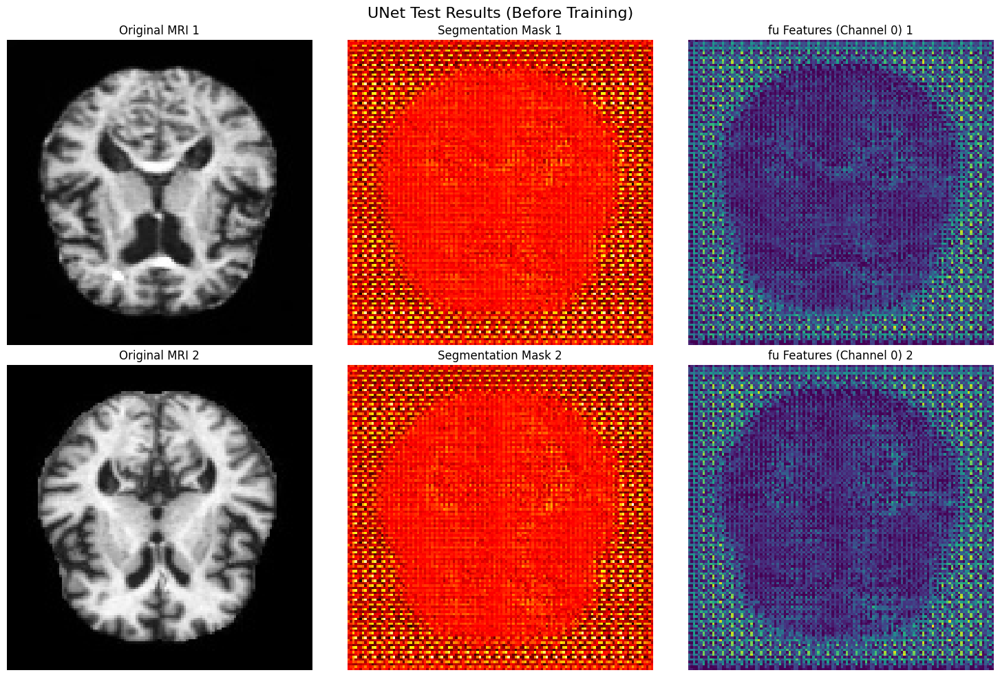

✅ UNet model is working correctly! Ready to continue with training.


In [24]:
# Step 25: Test the Fixed UNet Model
print("Testing the fixed UNet model...")

# Take a sample batch
for test_orig, test_quad in train_dataset.take(1):
    # Extract GAN features
    fg_features, fd_features = feature_provider.get_features(test_orig, test_quad)

    print(f"Test input shapes:")
    print(f"  Original MRI: {test_orig.shape}")
    print(f"  fg features: {fg_features.shape}")
    print(f"  fd features: {fd_features.shape}")

    # Test UNet forward pass
    try:
        segmentation_mask, fu_features = unet_model([test_orig, fg_features, fd_features])

        print(f"✅ UNet forward pass successful!")
        print(f"  Segmentation Mask: {segmentation_mask.shape}")
        print(f"  fu Features: {fu_features.shape}")
        print(f"  Segmentation range: [{segmentation_mask.numpy().min():.3f}, {segmentation_mask.numpy().max():.3f}]")

        # Display results
        def display_results(original_images, segmentation_masks, fu_features, num_samples=2):
            fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5 * num_samples))

            for i in range(num_samples):
                if num_samples == 1:
                    ax_orig, ax_mask, ax_fu = axes[0], axes[1], axes[2]
                else:
                    ax_orig, ax_mask, ax_fu = axes[i, 0], axes[i, 1], axes[i, 2]

                # Original MRI
                ax_orig.imshow(original_images[i, :, :, 0] * 0.5 + 0.5, cmap='gray')
                ax_orig.set_title(f'Original MRI {i+1}')
                ax_orig.axis('off')

                # Segmentation Mask
                mask = segmentation_masks[i, :, :, 0]
                ax_mask.imshow(mask, cmap='hot')
                ax_mask.set_title(f'Segmentation Mask {i+1}')
                ax_mask.axis('off')

                # fu Features (first channel)
                fu_first_channel = fu_features[i, :, :, 0]
                ax_fu.imshow(fu_first_channel, cmap='viridis')
                ax_fu.set_title(f'fu Features (Channel 0) {i+1}')
                ax_fu.axis('off')

            plt.suptitle('UNet Test Results (Before Training)', fontsize=16)
            plt.tight_layout()
            plt.show()

        display_results(test_orig, segmentation_mask, fu_features)

    except Exception as e:
        print(f"❌ Error during forward pass: {e}")
        import traceback
        traceback.print_exc()

    break

print("✅ UNet model is working correctly! Ready to continue with training.")

In [25]:
# Step 26: Generate Ensemble Pseudo-Labels for Training
print("Generating ensemble pseudo-labels for UNet training...")

def create_ensemble_pseudo_labels(images):
    """
    Combine multiple pseudo-label generation methods for robust weak supervision
    """
    ensemble_masks = []

    for i, img in enumerate(images):
        if i % 10 == 0:
            print(f"Processing image {i+1}/{len(images)}...")

        if len(img.shape) == 3 and img.shape[-1] == 1:
            img_2d = img[:, :, 0]
        else:
            img_2d = img

        # Denormalize from [-1, 1] to [0, 255] for OpenCV processing
        if img_2d.min() < 0:
            img_processed = ((img_2d * 0.5 + 0.5) * 255).astype(np.uint8)
        else:
            img_processed = (img_2d * 255).astype(np.uint8)

        # Method 1: Otsu thresholding
        _, mask1 = cv2.threshold(img_processed, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Method 2: Adaptive thresholding
        mask2 = cv2.adaptiveThreshold(img_processed, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                    cv2.THRESH_BINARY, 11, 2)

        # Method 3: Morphological operations
        _, mask3_temp = cv2.threshold(img_processed, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        kernel = np.ones((3,3), np.uint8)
        mask3 = cv2.morphologyEx(mask3_temp, cv2.MORPH_OPEN, kernel)
        mask3 = cv2.morphologyEx(mask3, cv2.MORPH_CLOSE, kernel)

        # Method 4: Canny edge detection + dilation
        edges = cv2.Canny(img_processed, 50, 150)
        kernel_dilate = np.ones((3,3), np.uint8)
        mask4 = cv2.dilate(edges, kernel_dilate, iterations=1)

        # Convert all masks to float and normalize
        mask1_float = mask1.astype(np.float32) / 255.0
        mask2_float = mask2.astype(np.float32) / 255.0
        mask3_float = mask3.astype(np.float32) / 255.0
        mask4_float = mask4.astype(np.float32) / 255.0

        # Combine methods with weighted average
        combined_mask = (mask1_float * 0.2 + mask2_float * 0.2 +
                        mask3_float * 0.4 + mask4_float * 0.2)

        # Apply threshold to get binary mask
        final_mask = (combined_mask > 0.3).astype(np.float32)

        # Add channel dimension
        final_mask_with_channel = final_mask[..., np.newaxis]

        ensemble_masks.append(final_mask_with_channel)

    return np.array(ensemble_masks)

# Generate ensemble pseudo-labels
print("Generating ensemble pseudo-labels...")
ensemble_masks = create_ensemble_pseudo_labels(original_imgs)

print(f"✅ Generated {len(ensemble_masks)} ensemble pseudo-masks")
print(f"Pseudo-masks shape: {ensemble_masks.shape}")
print(f"Pseudo-masks range: [{ensemble_masks.min():.3f}, {ensemble_masks.max():.3f}]")

Generating ensemble pseudo-labels for UNet training...
Generating ensemble pseudo-labels...
Processing image 1/5...
✅ Generated 5 ensemble pseudo-masks
Pseudo-masks shape: (5, 128, 128, 1)
Pseudo-masks range: [0.000, 1.000]


Visualizing ensemble pseudo-labels...


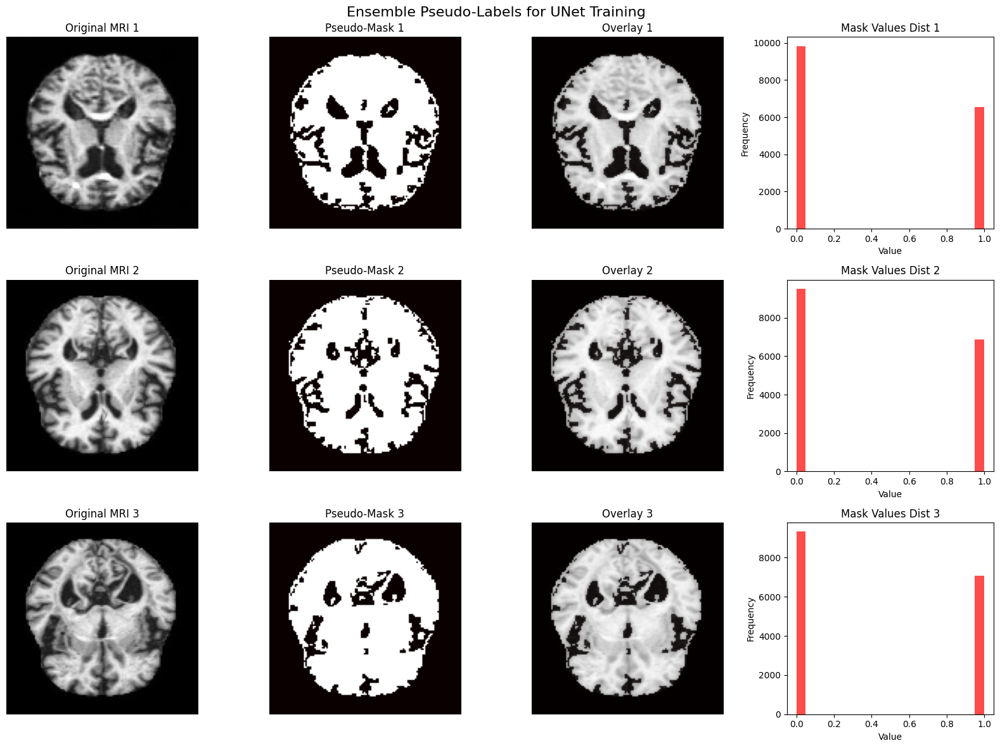

📊 Pseudo-label Statistics:
   Total lesion pixels: 34139
   Lesion percentage: 41.67%
   Average mask value: 0.4167


In [26]:
# Step 27: Visualize Ensemble Pseudo-Labels
print("Visualizing ensemble pseudo-labels...")

def visualize_ensemble_results(original_images, pseudo_masks, num_samples=3):
    """Visualize original images with generated pseudo-labels"""
    fig, axes = plt.subplots(num_samples, 4, figsize=(16, 4 * num_samples))

    for i in range(num_samples):
        if num_samples == 1:
            ax_orig, ax_mask, ax_overlay, ax_hist = axes[0], axes[1], axes[2], axes[3]
        else:
            ax_orig, ax_mask, ax_overlay, ax_hist = axes[i, 0], axes[i, 1], axes[i, 2], axes[i, 3]

        # Original MRI
        ax_orig.imshow(original_images[i] * 0.5 + 0.5, cmap='gray')
        ax_orig.set_title(f'Original MRI {i+1}')
        ax_orig.axis('off')

        # Pseudo-mask
        ax_mask.imshow(pseudo_masks[i, :, :, 0], cmap='hot')
        ax_mask.set_title(f'Pseudo-Mask {i+1}')
        ax_mask.axis('off')

        # Overlay
        ax_overlay.imshow(original_images[i] * 0.5 + 0.5, cmap='gray')
        ax_overlay.imshow(pseudo_masks[i, :, :, 0], cmap='hot', alpha=0.5)
        ax_overlay.set_title(f'Overlay {i+1}')
        ax_overlay.axis('off')

        # Histogram of mask values
        ax_hist.hist(pseudo_masks[i, :, :, 0].flatten(), bins=20, alpha=0.7, color='red')
        ax_hist.set_title(f'Mask Values Dist {i+1}')
        ax_hist.set_xlabel('Value')
        ax_hist.set_ylabel('Frequency')

    plt.suptitle('Ensemble Pseudo-Labels for UNet Training', fontsize=16)
    plt.tight_layout()
    plt.show()

# Visualize the results
visualize_ensemble_results(original_imgs, ensemble_masks)

# Calculate statistics
total_pixels = ensemble_masks[0].shape[0] * ensemble_masks[0].shape[1] * len(ensemble_masks)
lesion_pixels = np.sum(ensemble_masks > 0.5)
lesion_percentage = (lesion_pixels / total_pixels) * 100

print(f"📊 Pseudo-label Statistics:")
print(f"   Total lesion pixels: {lesion_pixels}")
print(f"   Lesion percentage: {lesion_percentage:.2f}%")
print(f"   Average mask value: {np.mean(ensemble_masks):.4f}")

In [27]:
# Step 28: Create UNet Training Dataset with Pseudo-Labels (FIXED)
print("Creating UNet training dataset with ensemble pseudo-labels...")

def create_unet_training_pipeline(original_images, feature_provider, ground_truth_masks, quadrant_images=None, batch_size=2):
    """
    Create complete training pipeline for UNet
    """
    def process_batch(orig_batch, mask_batch, quad_batch):
        """Process a single batch"""
        # Extract GAN features
        fg_batch, fd_batch = feature_provider.get_features(orig_batch, quad_batch)

        # Inputs: original + GAN features
        # Return as a tuple of three tensors
        inputs_tuple = (orig_batch, fg_batch, fd_batch)

        # Outputs: segmentation mask + fu features (dummy for now)
        batch_size = tf.shape(orig_batch)[0]
        fu_dummy_shape = (batch_size, 128, 128, 64)  # Match the fu_features output shape
        fu_dummy = tf.zeros(fu_dummy_shape, dtype=tf.float32)

        outputs_tuple = (mask_batch, fu_dummy)

        return inputs_tuple, outputs_tuple

    # Create base dataset
    if quadrant_images is not None:
        dataset = tf.data.Dataset.from_tensor_slices((original_images, ground_truth_masks, quadrant_images))
    else:
        # Create dummy quadrant images
        dummy_quadrants = np.zeros((len(original_images), 128, 128, 4), dtype=np.float32)
        dataset = tf.data.Dataset.from_tensor_slices((original_images, ground_truth_masks, dummy_quadrants))

    # Apply processing - FIXED: Properly handle tuple returns
    dataset = dataset.batch(batch_size)

    # Process each batch
    def process_wrapper(orig, mask, quad):
        # Use tf.py_function with proper output structure
        result = tf.py_function(
            func=lambda o, m, q: process_batch(o, m, q),
            inp=[orig, mask, quad],
            Tout=(
                (tf.float32, tf.float32, tf.float32),  # Inputs tuple
                (tf.float32, tf.float32)               # Outputs tuple
            )
        )
        return result

    dataset = dataset.map(process_wrapper, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset

# Alternative simpler approach without tf.py_function
def create_unet_training_pipeline_simple(original_images, feature_provider, ground_truth_masks, quadrant_images=None, batch_size=2):
    """
    Simpler approach: Precompute all features first, then create dataset
    """
    print("Precomputing GAN features for all images...")

    # Precompute all GAN features
    all_fg_features = []
    all_fd_features = []

    for i in range(len(original_images)):
        if i % 5 == 0:
            print(f"Precomputing features for image {i+1}/{len(original_images)}...")

        # Get single image
        orig_img = original_images[i:i+1]  # Keep batch dimension
        quad_img = quadrant_images[i:i+1] if quadrant_images is not None else None

        # Extract features
        fg, fd = feature_provider.get_features(orig_img, quad_img)
        all_fg_features.append(fg[0])  # Remove batch dimension
        all_fd_features.append(fd[0])  # Remove batch dimension

    # Convert to arrays
    all_fg_features = np.array(all_fg_features)
    all_fd_features = np.array(all_fd_features)

    print(f"Precomputed features:")
    print(f"  fg_features: {all_fg_features.shape}")
    print(f"  fd_features: {all_fd_features.shape}")

    # Create dataset directly from precomputed features
    dataset = tf.data.Dataset.from_tensor_slices((
        original_images,
        all_fg_features,
        all_fd_features,
        ground_truth_masks
    ))

    # Create dummy fu features (will be generated during training)
    def add_dummy_fu(orig, fg, fd, mask):
        batch_size = tf.shape(orig)[0]
        fu_dummy = tf.zeros((batch_size, 128, 128, 64), dtype=tf.float32)
        return (orig, fg, fd), (mask, fu_dummy)

    dataset = dataset.batch(batch_size)
    dataset = dataset.map(add_dummy_fu, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset

# Prepare the data
original_with_channel = original_imgs[..., np.newaxis]

# Stack quadrants
quadrant_stacked = []
for i in range(len(quadrant_imgs)):
    stacked = np.stack(quadrant_imgs[i], axis=-1)
    quadrant_stacked.append(stacked)
quadrant_stacked = np.array(quadrant_stacked)

print(f"Original images shape: {original_with_channel.shape}")
print(f"Pseudo-masks shape: {ensemble_masks.shape}")
print(f"Quadrant images shape: {quadrant_stacked.shape}")

# Create the training dataset using the simpler approach
print("Creating training dataset (simpler approach)...")
unet_training_dataset = create_unet_training_pipeline_simple(
    original_images=original_with_channel,
    feature_provider=feature_provider,
    ground_truth_masks=ensemble_masks,
    quadrant_images=quadrant_stacked,
    batch_size=2
)

# Test the dataset
print("Testing UNet training dataset with pseudo-labels...")
for (orig_batch, fg_batch, fd_batch), (mask_batch, fu_batch) in unet_training_dataset.take(1):
    print(f"✅ Dataset created successfully!")
    print(f"   Input shapes:")
    print(f"     Original: {orig_batch.shape}")
    print(f"     fg: {fg_batch.shape}")
    print(f"     fd: {fd_batch.shape}")
    print(f"   Output shapes:")
    print(f"     Mask: {mask_batch.shape}")
    print(f"     fu: {fu_batch.shape}")
    break

Creating UNet training dataset with ensemble pseudo-labels...
Original images shape: (5, 128, 128, 1)
Pseudo-masks shape: (5, 128, 128, 1)
Quadrant images shape: (5, 128, 128, 4)
Creating training dataset (simpler approach)...
Precomputing GAN features for all images...
Precomputing features for image 1/5...
Precomputed features:
  fg_features: (5, 128, 128, 64)
  fd_features: (5, 1024)
Testing UNet training dataset with pseudo-labels...
✅ Dataset created successfully!
   Input shapes:
     Original: (2, 128, 128, 1)
     fg: (2, 128, 128, 64)
     fd: (2, 1024)
   Output shapes:
     Mask: (2, 128, 128, 1)
     fu: (2, 128, 128, 64)


In [28]:
# Step 29: Implement Robust UNet Training with Pseudo-Labels
print("Implementing robust UNet training with pseudo-labels...")

# Custom loss functions for noisy labels
def robust_dice_loss(y_true, y_pred, smooth=1e-6):
    """
    Dice loss that's more robust to noisy pseudo-labels
    """
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    dice = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return 1 - dice

# Compile the UNet model with robust losses
print("Compiling UNet with robust loss functions...")

# Since we have multiple outputs, we need to specify losses for each output
unet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss={
        'segmentation_mask': robust_dice_loss,
        'fu_features': 'mse'
    },
    loss_weights={
        'segmentation_mask': 1.0,
        'fu_features': 0.1
    },
    metrics={
        'segmentation_mask': ['accuracy', 'mse']
    }
)

print("✅ UNet compiled with robust loss functions!")

Implementing robust UNet training with pseudo-labels...
Compiling UNet with robust loss functions...
✅ UNet compiled with robust loss functions!


In [29]:
# Step 30: Train UNet with Ensemble Pseudo-Labels
print("Starting UNet training with ensemble pseudo-labels...")

# Training callbacks for better monitoring
training_callbacks = [
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.5,
        patience=5,
        min_lr=1e-7,
        verbose=1
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,  # Reduced for small dataset
        restore_best_weights=True,
        verbose=1
    ),
    tf.keras.callbacks.ModelCheckpoint(
        '/content/best_unet_pseudo_labels.h5',
        monitor='loss',
        save_best_only=True,
        save_weights_only=False,
        verbose=1
    )
]

# Training parameters - use fewer epochs for small dataset
epochs = 30

print(f"Training for {epochs} epochs with {len(original_imgs)} samples...")
print("This might take a while...")

# Train the model
try:
    history = unet_model.fit(
        unet_training_dataset,
        epochs=epochs,
        callbacks=training_callbacks,
        verbose=1
    )
    print("✅ UNet training with pseudo-labels completed!")

except Exception as e:
    print(f"❌ Training error: {e}")
    print("Trying with smaller learning rate...")

    # Retry with smaller learning rate
    unet_model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
        loss={
            'segmentation_mask': robust_dice_loss,
            'fu_features': 'mse'
        },
        loss_weights={
            'segmentation_mask': 1.0,
            'fu_features': 0.1
        }
    )

    history = unet_model.fit(
        unet_training_dataset,
        epochs=epochs,
        callbacks=training_callbacks,
        verbose=1
    )
    print("✅ UNet training completed with smaller learning rate!")

Starting UNet training with ensemble pseudo-labels...
Training for 30 epochs with 5 samples...
This might take a while...
Epoch 1/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.0105 - loss: 0.5431 - segmentation_mask_accuracy: 0.6397 - segmentation_mask_loss: 0.5414 - segmentation_mask_mse: 0.2449
Epoch 1: loss improved from inf to 0.53861, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 56s 13s/step - fu_features_loss: 0.0105 - loss: 0.5420 - segmentation_mask_accuracy: 0.6500 - segmentation_mask_loss: 0.5399 - segmentation_mask_mse: 0.2441 - learning_rate: 1.0000e-04
Epoch 2/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.0123 - loss: 0.5186 - segmentation_mask_accuracy: 0.8625 - segmentation_mask_loss: 0.5166 - segmentation_mask_mse: 0.2172
Epoch 2: loss improved from 0.53861 to 0.51377, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 30s 10s/step - fu_features_loss: 0.0125 - loss: 0.5174 - segmentation_mask_accuracy: 0.8659 - segmentation_mask_loss: 0.5150 - segmentation_mask_mse: 0.2163 - learning_rate: 1.0000e-04
Epoch 3/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.0171 - loss: 0.4907 - segmentation_mask_accuracy: 0.9123 - segmentation_mask_loss: 0.4880 - segmentation_mask_mse: 0.1891
Epoch 3: loss improved from 0.51377 to 0.48513, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 37s 8s/step - fu_features_loss: 0.0173 - loss: 0.4893 - segmentation_mask_accuracy: 0.9130 - segmentation_mask_loss: 0.4861 - segmentation_mask_mse: 0.1882 - learning_rate: 1.0000e-04
Epoch 4/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.0257 - loss: 0.4556 - segmentation_mask_accuracy: 0.9132 - segmentation_mask_loss: 0.4518 - segmentation_mask_mse: 0.1593
Epoch 4: loss improved from 0.48513 to 0.44873, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 47s 11s/step - fu_features_loss: 0.0262 - loss: 0.4539 - segmentation_mask_accuracy: 0.9138 - segmentation_mask_loss: 0.4494 - segmentation_mask_mse: 0.1583 - learning_rate: 1.0000e-04
Epoch 5/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.0426 - loss: 0.4075 - segmentation_mask_accuracy: 0.9131 - segmentation_mask_loss: 0.4017 - segmentation_mask_mse: 0.1268
Epoch 5: loss improved from 0.44873 to 0.39855, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 45s 13s/step - fu_features_loss: 0.0438 - loss: 0.4053 - segmentation_mask_accuracy: 0.9137 - segmentation_mask_loss: 0.3985 - segmentation_mask_mse: 0.1257 - learning_rate: 1.0000e-04
Epoch 6/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.0804 - loss: 0.3401 - segmentation_mask_accuracy: 0.9124 - segmentation_mask_loss: 0.3300 - segmentation_mask_mse: 0.0942
Epoch 6: loss improved from 0.39855 to 0.32836, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 39s 12s/step - fu_features_loss: 0.0831 - loss: 0.3372 - segmentation_mask_accuracy: 0.9130 - segmentation_mask_loss: 0.3257 - segmentation_mask_mse: 0.0932 - learning_rate: 1.0000e-04
Epoch 7/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.1810 - loss: 0.2526 - segmentation_mask_accuracy: 0.9083 - segmentation_mask_loss: 0.2324 - segmentation_mask_mse: 0.0688
Epoch 7: loss improved from 0.32836 to 0.23971, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 42s 13s/step - fu_features_loss: 0.1895 - loss: 0.2494 - segmentation_mask_accuracy: 0.9088 - segmentation_mask_loss: 0.2273 - segmentation_mask_mse: 0.0682 - learning_rate: 1.0000e-04
Epoch 8/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.5243 - loss: 0.1934 - segmentation_mask_accuracy: 0.9007 - segmentation_mask_loss: 0.1413 - segmentation_mask_mse: 0.0769
Epoch 8: loss improved from 0.23971 to 0.19279, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 42s 12s/step - fu_features_loss: 0.5495 - loss: 0.1932 - segmentation_mask_accuracy: 0.9012 - segmentation_mask_loss: 0.1388 - segmentation_mask_mse: 0.0769 - learning_rate: 1.0000e-04
Epoch 9/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.7903 - loss: 0.1977 - segmentation_mask_accuracy: 0.9053 - segmentation_mask_loss: 0.1182 - segmentation_mask_mse: 0.0734
Epoch 9: loss improved from 0.19279 to 0.19206, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 10s/step - fu_features_loss: 0.7807 - loss: 0.1963 - segmentation_mask_accuracy: 0.9061 - segmentation_mask_loss: 0.1176 - segmentation_mask_mse: 0.0724 - learning_rate: 1.0000e-04
Epoch 10/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.5323 - loss: 0.1769 - segmentation_mask_accuracy: 0.9111 - segmentation_mask_loss: 0.1235 - segmentation_mask_mse: 0.0620
Epoch 10: loss improved from 0.19206 to 0.17255, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 29s 10s/step - fu_features_loss: 0.5242 - loss: 0.1758 - segmentation_mask_accuracy: 0.9119 - segmentation_mask_loss: 0.1231 - segmentation_mask_mse: 0.0613 - learning_rate: 1.0000e-04
Epoch 11/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3818 - loss: 0.1676 - segmentation_mask_accuracy: 0.9125 - segmentation_mask_loss: 0.1294 - segmentation_mask_mse: 0.0594
Epoch 11: loss improved from 0.17255 to 0.16454, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 39s 8s/step - fu_features_loss: 0.3793 - loss: 0.1669 - segmentation_mask_accuracy: 0.9132 - segmentation_mask_loss: 0.1289 - segmentation_mask_mse: 0.0590 - learning_rate: 1.0000e-04
Epoch 12/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3341 - loss: 0.1649 - segmentation_mask_accuracy: 0.9127 - segmentation_mask_loss: 0.1315 - segmentation_mask_mse: 0.0602
Epoch 12: loss improved from 0.16454 to 0.16203, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - fu_features_loss: 0.3339 - loss: 0.1642 - segmentation_mask_accuracy: 0.9134 - segmentation_mask_loss: 0.1308 - segmentation_mask_mse: 0.0597 - learning_rate: 1.0000e-04
Epoch 13/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3260 - loss: 0.1624 - segmentation_mask_accuracy: 0.9142 - segmentation_mask_loss: 0.1298 - segmentation_mask_mse: 0.0592 
Epoch 13: loss improved from 0.16203 to 0.15926, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 10s/step - fu_features_loss: 0.3265 - loss: 0.1616 - segmentation_mask_accuracy: 0.9150 - segmentation_mask_loss: 0.1289 - segmentation_mask_mse: 0.0587 - learning_rate: 1.0000e-04
Epoch 14/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3316 - loss: 0.1582 - segmentation_mask_accuracy: 0.9183 - segmentation_mask_loss: 0.1250 - segmentation_mask_mse: 0.0557
Epoch 14: loss improved from 0.15926 to 0.15505, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 47s 12s/step - fu_features_loss: 0.3325 - loss: 0.1574 - segmentation_mask_accuracy: 0.9192 - segmentation_mask_loss: 0.1242 - segmentation_mask_mse: 0.0551 - learning_rate: 1.0000e-04
Epoch 15/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3475 - loss: 0.1538 - segmentation_mask_accuracy: 0.9245 - segmentation_mask_loss: 0.1190 - segmentation_mask_mse: 0.0512
Epoch 15: loss improved from 0.15505 to 0.15087, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 37s 10s/step - fu_features_loss: 0.3490 - loss: 0.1530 - segmentation_mask_accuracy: 0.9253 - segmentation_mask_loss: 0.1182 - segmentation_mask_mse: 0.0507 - learning_rate: 1.0000e-04
Epoch 16/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3766 - loss: 0.1502 - segmentation_mask_accuracy: 0.9289 - segmentation_mask_loss: 0.1126 - segmentation_mask_mse: 0.0483
Epoch 16: loss improved from 0.15087 to 0.14762, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 53s 15s/step - fu_features_loss: 0.3785 - loss: 0.1496 - segmentation_mask_accuracy: 0.9296 - segmentation_mask_loss: 0.1118 - segmentation_mask_mse: 0.0479 - learning_rate: 1.0000e-04
Epoch 17/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.4090 - loss: 0.1474 - segmentation_mask_accuracy: 0.9309 - segmentation_mask_loss: 0.1066 - segmentation_mask_mse: 0.0475
Epoch 17: loss improved from 0.14762 to 0.14488, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 30s 10s/step - fu_features_loss: 0.4104 - loss: 0.1468 - segmentation_mask_accuracy: 0.9315 - segmentation_mask_loss: 0.1059 - segmentation_mask_mse: 0.0471 - learning_rate: 1.0000e-04
Epoch 18/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.4206 - loss: 0.1447 - segmentation_mask_accuracy: 0.9322 - segmentation_mask_loss: 0.1028 - segmentation_mask_mse: 0.0470
Epoch 18: loss improved from 0.14488 to 0.14207, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 45s 13s/step - fu_features_loss: 0.4205 - loss: 0.1441 - segmentation_mask_accuracy: 0.9328 - segmentation_mask_loss: 0.1021 - segmentation_mask_mse: 0.0466 - learning_rate: 1.0000e-04
Epoch 19/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.4018 - loss: 0.1412 - segmentation_mask_accuracy: 0.9352 - segmentation_mask_loss: 0.1011 - segmentation_mask_mse: 0.0454
Epoch 19: loss improved from 0.14207 to 0.13863, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 8s/step - fu_features_loss: 0.4009 - loss: 0.1406 - segmentation_mask_accuracy: 0.9357 - segmentation_mask_loss: 0.1006 - segmentation_mask_mse: 0.0450 - learning_rate: 1.0000e-04
Epoch 20/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3751 - loss: 0.1373 - segmentation_mask_accuracy: 0.9375 - segmentation_mask_loss: 0.0999 - segmentation_mask_mse: 0.0439
Epoch 20: loss improved from 0.13863 to 0.13483, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 44s 11s/step - fu_features_loss: 0.3744 - loss: 0.1367 - segmentation_mask_accuracy: 0.9381 - segmentation_mask_loss: 0.0994 - segmentation_mask_mse: 0.0437 - learning_rate: 1.0000e-04
Epoch 21/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3569 - loss: 0.1338 - segmentation_mask_accuracy: 0.9385 - segmentation_mask_loss: 0.0982 - segmentation_mask_mse: 0.0440
Epoch 21: loss improved from 0.13483 to 0.13134, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 31s 11s/step - fu_features_loss: 0.3559 - loss: 0.1332 - segmentation_mask_accuracy: 0.9392 - segmentation_mask_loss: 0.0978 - segmentation_mask_mse: 0.0436 - learning_rate: 1.0000e-04
Epoch 22/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3322 - loss: 0.1317 - segmentation_mask_accuracy: 0.9428 - segmentation_mask_loss: 0.0986 - segmentation_mask_mse: 0.0428
Epoch 22: loss improved from 0.13134 to 0.12954, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 13s/step - fu_features_loss: 0.3313 - loss: 0.1311 - segmentation_mask_accuracy: 0.9435 - segmentation_mask_loss: 0.0982 - segmentation_mask_mse: 0.0423 - learning_rate: 1.0000e-04
Epoch 23/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3311 - loss: 0.1279 - segmentation_mask_accuracy: 0.9475 - segmentation_mask_loss: 0.0949 - segmentation_mask_mse: 0.0399
Epoch 23: loss improved from 0.12954 to 0.12581, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 38s 11s/step - fu_features_loss: 0.3324 - loss: 0.1274 - segmentation_mask_accuracy: 0.9479 - segmentation_mask_loss: 0.0944 - segmentation_mask_mse: 0.0397 - learning_rate: 1.0000e-04
Epoch 24/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3584 - loss: 0.1258 - segmentation_mask_accuracy: 0.9459 - segmentation_mask_loss: 0.0901 - segmentation_mask_mse: 0.0408
Epoch 24: loss improved from 0.12581 to 0.12369, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 28s 10s/step - fu_features_loss: 0.3590 - loss: 0.1253 - segmentation_mask_accuracy: 0.9464 - segmentation_mask_loss: 0.0897 - segmentation_mask_mse: 0.0404 - learning_rate: 1.0000e-04
Epoch 25/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3624 - loss: 0.1224 - segmentation_mask_accuracy: 0.9499 - segmentation_mask_loss: 0.0864 - segmentation_mask_mse: 0.0376
Epoch 25: loss improved from 0.12369 to 0.12048, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 31s 11s/step - fu_features_loss: 0.3620 - loss: 0.1219 - segmentation_mask_accuracy: 0.9502 - segmentation_mask_loss: 0.0860 - segmentation_mask_mse: 0.0374 - learning_rate: 1.0000e-04
Epoch 26/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3456 - loss: 0.1227 - segmentation_mask_accuracy: 0.9491 - segmentation_mask_loss: 0.0885 - segmentation_mask_mse: 0.0392
Epoch 26: loss did not improve from 0.12048
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 7s/step - fu_features_loss: 0.3464 - loss: 0.1222 - segmentation_mask_accuracy: 0.9495 - segmentation_mask_loss: 0.0881 - segmentation_mask_mse: 0.0388 - learning_rate: 1.0000e-04
Epoch 27/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3546 - loss: 0.1181 - segmentation_mask_accuracy: 0.9532 - segmentation_mask_loss: 0.0828 - segmentation_mask_mse: 0.0350
Epoch 27: loss improved from 0.12048 to 0.11629, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 29s 10s/step - fu_features_loss: 0.3545 - loss: 0.1177 - segmentation_mask_accuracy: 0.9534 - segmentation_mask_loss: 0.0825 - segmentation_mask_mse: 0.0350 - learning_rate: 1.0000e-04
Epoch 28/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3404 - loss: 0.1212 - segmentation_mask_accuracy: 0.9456 - segmentation_mask_loss: 0.0874 - segmentation_mask_mse: 0.0420
Epoch 28: loss did not improve from 0.11629
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 7s/step - fu_features_loss: 0.3408 - loss: 0.1205 - segmentation_mask_accuracy: 0.9463 - segmentation_mask_loss: 0.0868 - segmentation_mask_mse: 0.0413 - learning_rate: 1.0000e-04
Epoch 29/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3403 - loss: 0.1168 - segmentation_mask_accuracy: 0.9551 - segmentation_mask_loss: 0.0829 - segmentation_mask_mse: 0.0337
Epoch 29: loss improved from 0.11629 to 0.11519, saving model to /content/best_unet_pseudo_labels.h5


3/3 ━━━━━━━━━━━━━━━━━━━━ 52s 13s/step - fu_features_loss: 0.3394 - loss: 0.1164 - segmentation_mask_accuracy: 0.9551 - segmentation_mask_loss: 0.0827 - segmentation_mask_mse: 0.0337 - learning_rate: 1.0000e-04
Epoch 30/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - fu_features_loss: 0.3163 - loss: 0.1180 - segmentation_mask_accuracy: 0.9470 - segmentation_mask_loss: 0.0864 - segmentation_mask_mse: 0.0408
Epoch 30: loss did not improve from 0.11519
3/3 ━━━━━━━━━━━━━━━━━━━━ 30s 7s/step - fu_features_loss: 0.3173 - loss: 0.1173 - segmentation_mask_accuracy: 0.9475 - segmentation_mask_loss: 0.0857 - segmentation_mask_mse: 0.0404 - learning_rate: 1.0000e-04
Restoring model weights from the end of the best epoch: 29.
✅ UNet training with pseudo-labels completed!


Evaluating UNet training results...


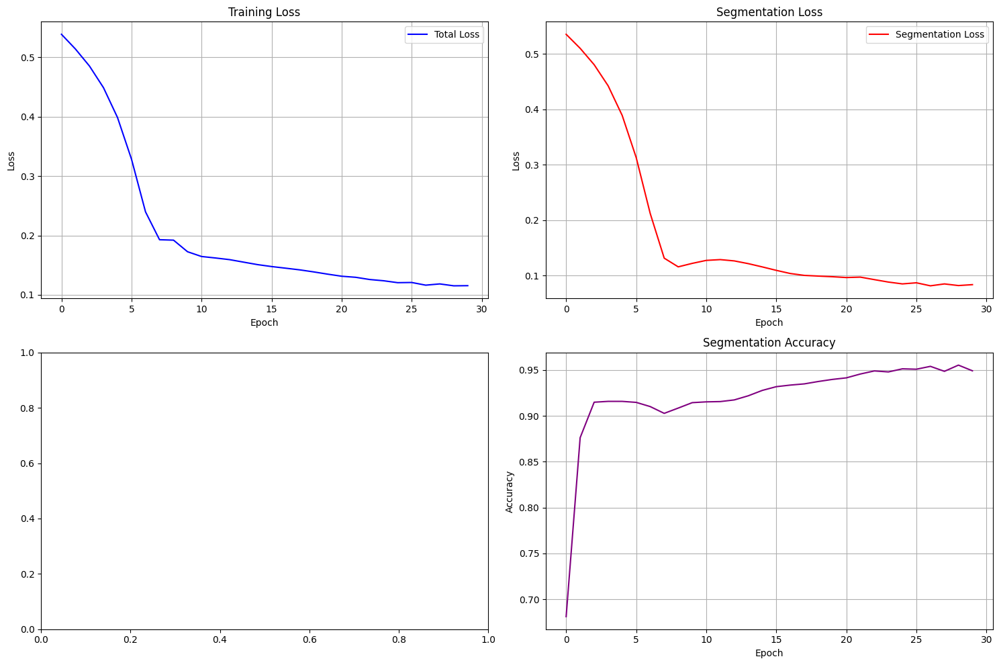

Testing trained UNet on sample data...


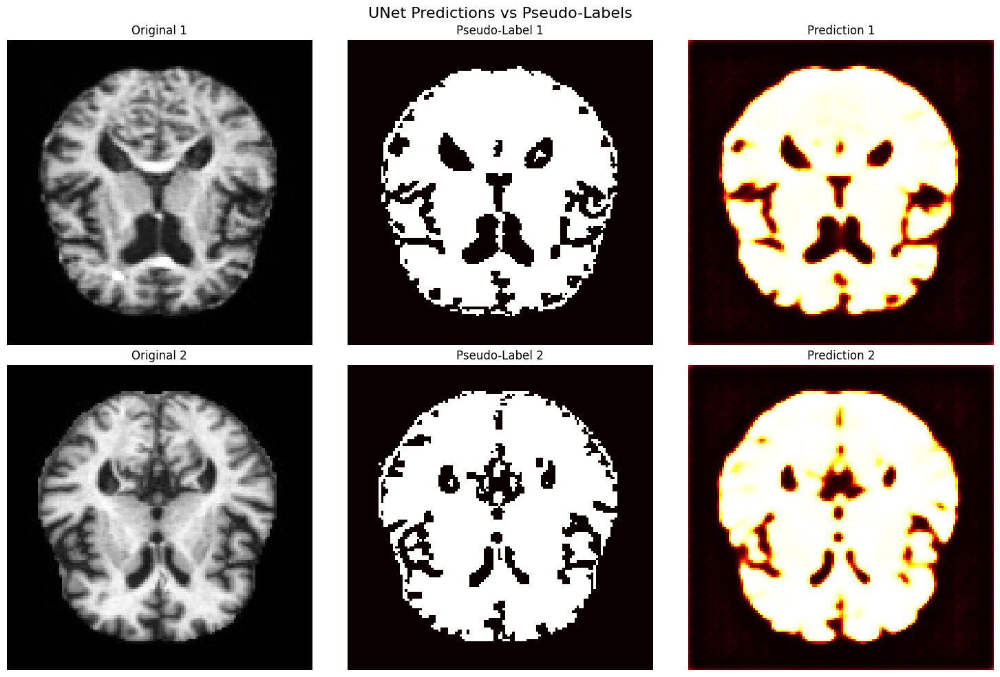

✅ Predictions shape: (2, 128, 128, 1)
✅ fu features shape: (2, 128, 128, 64)
✅ Prediction range: [0.005, 0.999]


In [30]:
# Step 31: Evaluate UNet Training Results
print("Evaluating UNet training results...")

def plot_training_results(history):
    """Plot training history and results"""
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))

    # Plot total loss
    axes[0, 0].plot(history.history['loss'], label='Total Loss', color='blue')
    axes[0, 0].set_title('Training Loss')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].legend()
    axes[0, 0].grid(True)

    # Plot segmentation loss
    if 'segmentation_mask_loss' in history.history:
        axes[0, 1].plot(history.history['segmentation_mask_loss'], label='Segmentation Loss', color='red')
        axes[0, 1].set_title('Segmentation Loss')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].set_ylabel('Loss')
        axes[0, 1].legend()
        axes[0, 1].grid(True)

    # Plot learning rate if available
    if 'lr' in history.history:
        axes[1, 0].plot(history.history['lr'], color='green')
        axes[1, 0].set_title('Learning Rate')
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].set_ylabel('Learning Rate')
        axes[1, 0].grid(True)

    # Plot segmentation accuracy if available
    if 'segmentation_mask_accuracy' in history.history:
        axes[1, 1].plot(history.history['segmentation_mask_accuracy'], color='purple')
        axes[1, 1].set_title('Segmentation Accuracy')
        axes[1, 1].set_xlabel('Epoch')
        axes[1, 1].set_ylabel('Accuracy')
        axes[1, 1].grid(True)

    plt.tight_layout()
    plt.show()

# Plot training history
if 'history' in locals():
    plot_training_results(history)
else:
    print("No training history found. Please run Step 30 first.")

# Test the trained model on sample data
print("Testing trained UNet on sample data...")
for (test_orig, test_fg, test_fd), (test_mask, _) in unet_training_dataset.take(1):
    try:
        predictions, fu_features = unet_model([test_orig, test_fg, test_fd], training=False)

        # Visualize predictions vs pseudo-labels
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))

        for i in range(min(2, test_orig.shape[0])):
            # Original
            axes[i, 0].imshow(test_orig[i, :, :, 0] * 0.5 + 0.5, cmap='gray')
            axes[i, 0].set_title(f'Original {i+1}')
            axes[i, 0].axis('off')

            # Pseudo-label (ground truth for training)
            axes[i, 1].imshow(test_mask[i, :, :, 0], cmap='hot')
            axes[i, 1].set_title(f'Pseudo-Label {i+1}')
            axes[i, 1].axis('off')

            # Prediction
            axes[i, 2].imshow(predictions[i, :, :, 0], cmap='hot')
            axes[i, 2].set_title(f'Prediction {i+1}')
            axes[i, 2].axis('off')

        plt.suptitle('UNet Predictions vs Pseudo-Labels', fontsize=16)
        plt.tight_layout()
        plt.show()

        print(f"✅ Predictions shape: {predictions.shape}")
        print(f"✅ fu features shape: {fu_features.shape}")
        print(f"✅ Prediction range: [{predictions.numpy().min():.3f}, {predictions.numpy().max():.3f}]")

    except Exception as e:
        print(f"❌ Error during inference: {e}")

    break

In [31]:
# Step 32: Save the Trained UNet Model
print("Saving trained UNet model...")

# Save the model
unet_model.save('/content/trained_alzheimer_unet.h5')
print("✅ UNet model saved as '/content/trained_alzheimer_unet.h5'")

# Save feature provider components
feature_provider.fg_extractor.save('/content/fg_extractor.h5')
feature_provider.fd_extractor.save('/content/fd_extractor.h5')
feature_provider.generator.save('/content/generator.h5')

print("✅ All components saved successfully!")
print("\n🎉 ALZHEIMER'S UNET PIPELINE COMPLETE!")
print("=" * 70)
print("You now have:")
print("✅ UNet model trained with ensemble pseudo-labels")
print("✅ GAN feature extractors for fg and fd features")
print("✅ Complete pipeline for Alzheimer's segmentation")
print("✅ fu features ready for classification pipeline")
print("=" * 70)

Saving trained UNet model...


✅ UNet model saved as '/content/trained_alzheimer_unet.h5'


✅ All components saved successfully!

🎉 ALZHEIMER'S UNET PIPELINE COMPLETE!
You now have:
✅ UNet model trained with ensemble pseudo-labels
✅ GAN feature extractors for fg and fd features
✅ Complete pipeline for Alzheimer's segmentation
✅ fu features ready for classification pipeline
